#AZURE DEV OPS FUNDAMENTALS CI/CD + BOARDS PROJECTS

What is Azure devops?

1. Azure Devops server is a MS product   that provides version control,reporting, requirements management,project management,automated builds, testing and release management capabilities.

2. It covers the entire application lifecycle and enables DevOps capabilities





serach azure devops in google

Create a account at meetgenius@gmail.com/Azure@123


##BASICS OF DEPLOYMENT

Q: what are application server ?

A : Application server or web servers are software server specifically designed to run applications or it is  server to host applications.

Example: apache tomcat server

Q: How does it shows up on the web, browser?

A: It communicates via http requests and send response calls over http protocol.

Q: what are hosted servers ?

A: These are physical machine where application, web, database are hosted.

Application server are hosted on these physical servers. Thus applicationserver can start at any port in hosted server and can be accessed through "Hosted Server IP address:postNumber" like 192.52.47.41:8080

Every machine can be uniquely identified by ip address

Example: linux server hosted on amazon web services which user purchases.


Q: How do then we access sites like amazon.com ,flipkart.com

A: these site names are registered domain names  where the 
hostname:portnumber is mapped with the site name

for example lets consider for a moment 192.45.12.10:8080 is address of flipkart application so http://www.flipkart.com is mapped to that hostipaddress:portnumber


Q: Do we copy our complete code on the application server to  run it ?

A: NO, we copy/deploy the build of the code that we write on the application server. (.war files)

To keep our application running ans to access it from anywhere , we should first build the code written with the help of build generator tools like maven so that the generated build files (.war in this case) is placed in the application/ webserver, after which we can access the developed application directly on the browser with http protocol @ hostmachine ip address : portnumber or with the mapped domain name.


 





##HOSTING APPLICATION ON APPLICATION SERVER (locally) with APACHE TOMCAT

1. Download the apache tomcat x64 bit .zip file to local machine

2. Unzip the contents and got to apache-tomcat<version>\bin folder and double click startup.batch file

3. Terminal will open and tomcat will launch 

4. Go to browser "http://localhost:8080" and check if it is up

5. Now place your .war file in the apache-tomcat<version>\webapps folder

6. Go to browser "http://localhost:8080/<.warfilename>" and check if it is up


## WHAT IS CONTINOUS INTEGRATION AND CONTINOUS DELIVERY

1. CI process means when you make a change in the code and check it in (i.e push the code to git repository), automatically build should get triggered and build files should be generated (like .war files). 

###Example : 
Git hub should notify external platforms Azure, Jenkins like in our case AzureDevops "that somebody pushed a new code in repository". Now AzureDevops will trigger build command to generate build files. In this process first Azure runs test, testing will happen unit test, integration tests will be executed first to ensure nothing breaks, post which Azure will trigger command like " mvn clean install" to generate build files. 

THIS IS CONTIONOUS INTEGRATION.

**small defination**: CI is the process of automating testing of code and build generation post that, everytime a team member commits changes to version control systems. (GIT)

2. CD process is extension to CI process where automated process deploys the build generated in CI process to application server staging env  (test environments where automated UI tests or backend test or regression pack or load tests runs). Once all the test passes it is deployed to production. Azure does this automation with the help of pipelines.

https://aws.amazon.com/devops/continuous-integration/

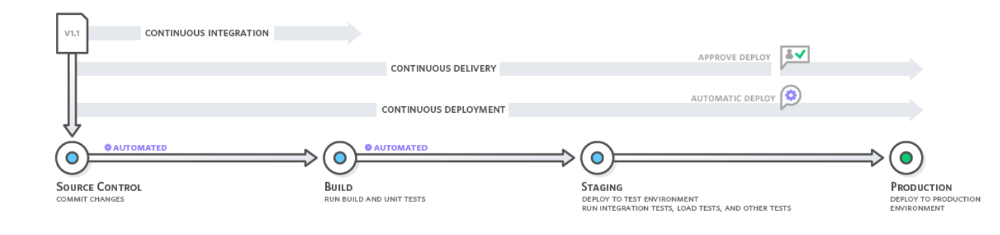



## AZURE PIPELINES

1. Build pipeline : These pipeline jobs clone the code from the assigned repositories and build the project based on instructions provided in the yaml file. Typically we use build pipelines to publish artifacts of the project 
(.war files , .jar files i.e build files are artifacts)



2. Release pipeline : These pipeline are used to deploy the build artifacts into the Agent machines. 


### HOW TO CREATE A BUILD PIPELINE

1. Under the Left side MENU PIPELINES, click Create Pipelines 

2. CONNECT TAB - It will ask for "Where is your code"

3. Select appropriate source (our case its git repo, select GitHub (YAML) )

4. SELECT TAB - It will connect to git , if creating first time, it will ask for github credentails. It will display all the repository under the particular account.

5. Select the repository of your choice

6. CONFIGURE TAB - select the appropriate build agent, in our case its maven.

7. REVIEW TAB - shows the pipeline YAML with name 'azure-pipelines.yml

See below figure
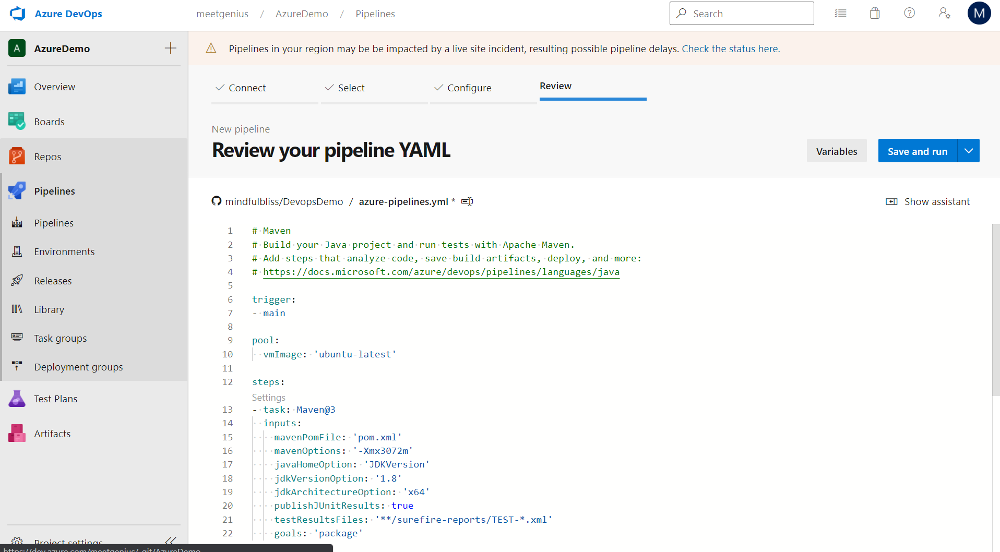



8. The azure-pipelines.yml file generated above should be checked into the repository, so that when it comes to build the code, Azure will simply search for the yml file and build it as per the specified properties in .yml file.

9. We have two options "Save" this option will checkin the .yml file to the repository. "Save and Run" this option will checkin the .yml file to the repository and also start the process of generating the build. In both options, a commit message " Set up CI with Azure Pipelines" is added to the .yml checkin.

10. For now click on the Save option and commit directly to the master branch.

11. Go the GitHUb Repo and check the lastest commit

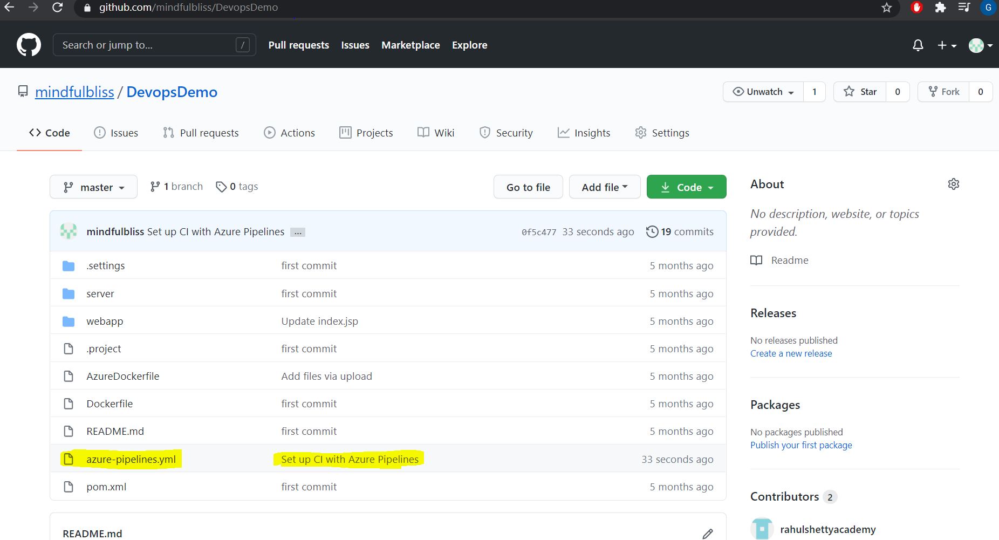

12. Now Click on Run Pipeline in AzureDevOps. It will to select parameters related to git branch,etc. Select master (as we have committed .yml file from above to master branch in step 10) and click Run

 ###UNDERSTANDING BUILD PIPELINE RUN CONFIGURATIONS AND BUILD LOGS

 13. So now azure will start building process

 14. It will initialise the job by selecting a Machine " ubuntu " in this case. refer below screenshot

 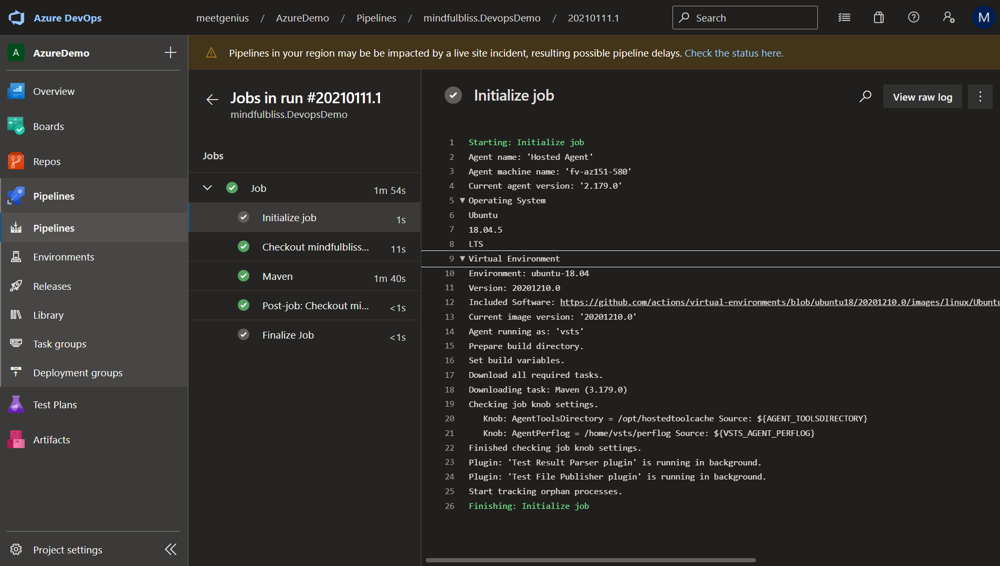 

15. Next step it went to github repo and checkout entire project.

START
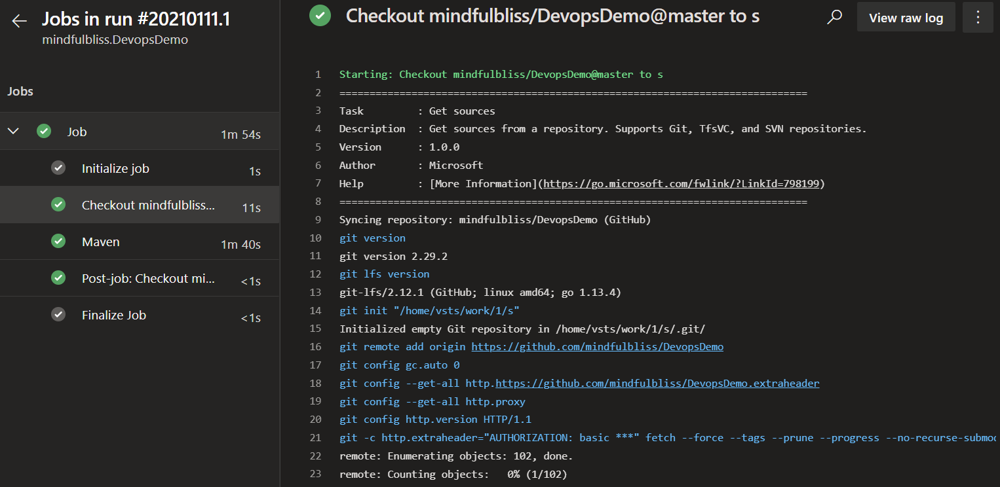


END:


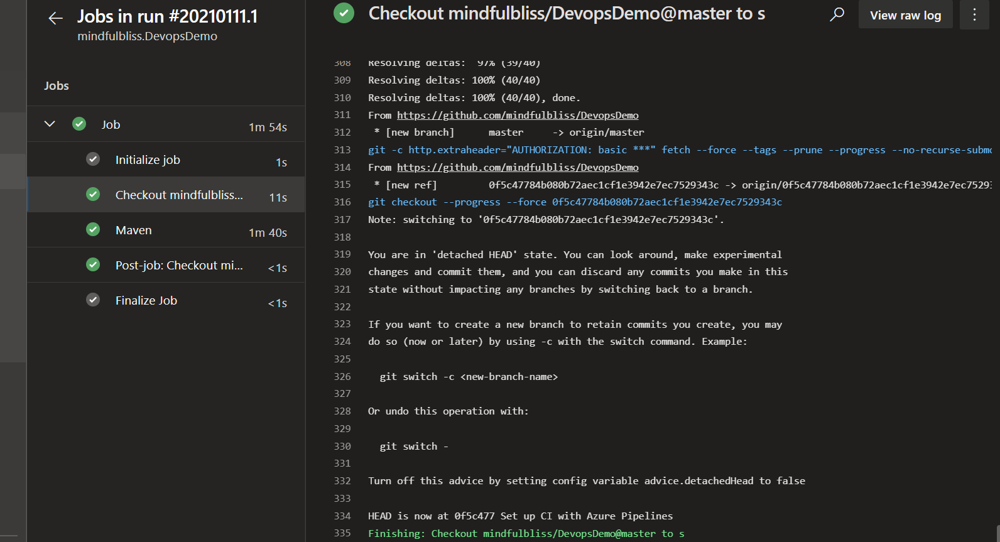

In above screeshot last line , the code is checkout to "s" folder in Ubuntu machine which Azure initialised during build job initialzation.

16. Then The selected Build agent ( MAVEN) will dowload dependcies for building the code, run the test, when all the tests pass genrated build.Check line 16 in below image, the code is available at /home/vsts/work/1/s/pom.xml and the build is generated at line 2487 (2nd image ) location

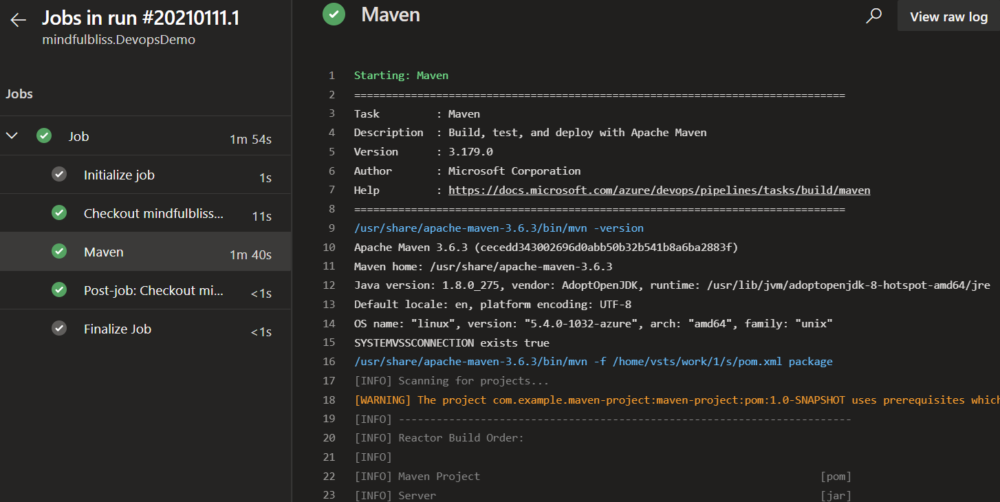

END:

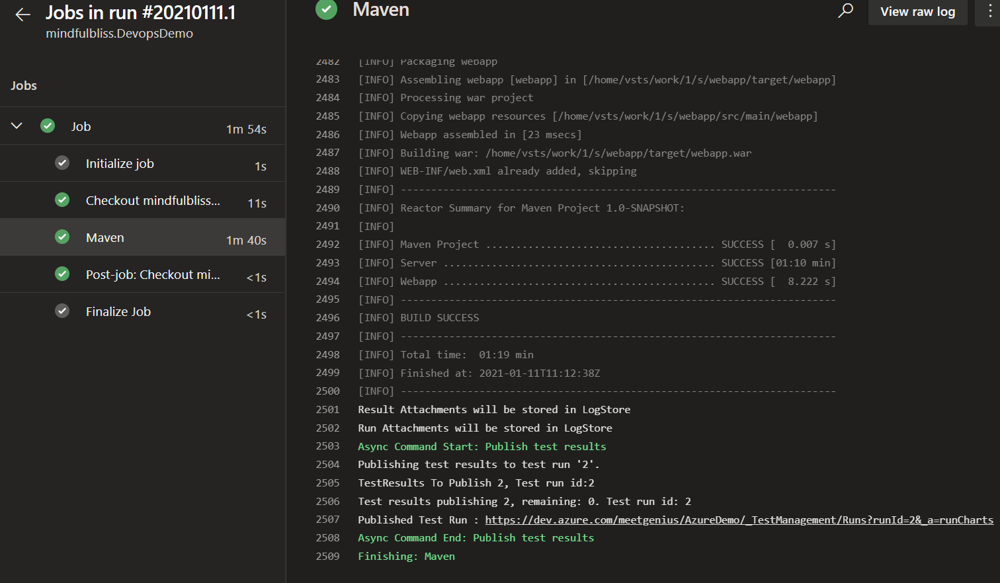



17. Now that the build is generated, our next goal is to deploy this build to the application server (in our case to apache tomcat server) so that the application can be accessed on the browser via http protocol.

But this .war file is on some ubuntu machine on some server. we need to bring this build file or artifact to publish here in Azure mindfulbliss.DevopsDemo project.

18. To do this we need to edit the .yml file genereated earlier.

19. Select the pipeline and click edit

20.  We have seen earlier the project files (.war file) is in "s"  folder , here s stands for source. Now we need to bring it to "a" folder , a stands for artifact

21. Now we need to perform two steps -> copy the build file from "s" folder to "a" folder and -> copy the file from "a" to Azure mindfulbliss.DevopsDemo project.

22. The .yml file is opened for editing, on the right side in the tasks select "Copy files from a source folder to target folder" highlighted in yellow.

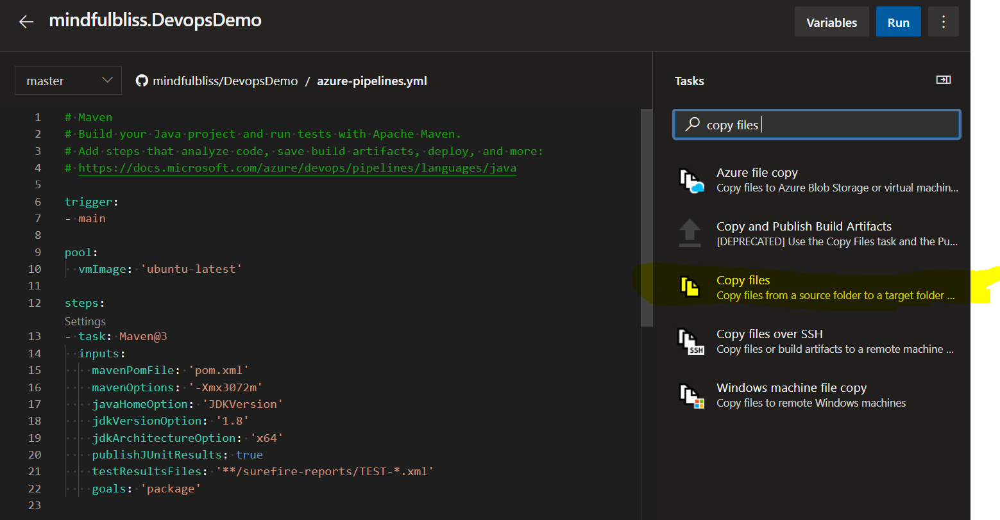

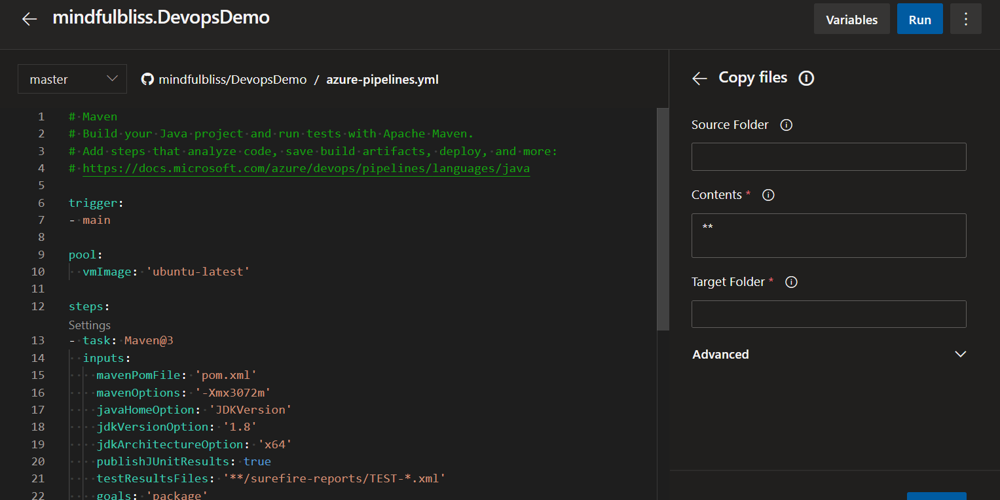

23. Click on the i icon on TARGET FOLDER and select the pre defined variable from example $(build.artifactstagingdirectory)
for more info google $(build.artifactstagingdirectory)

24. We need only .war file so enter **/*.war in the CONTENTS
"**/*.war" will search all the child folder for any .war file and click on Add
refer image for point 23,24


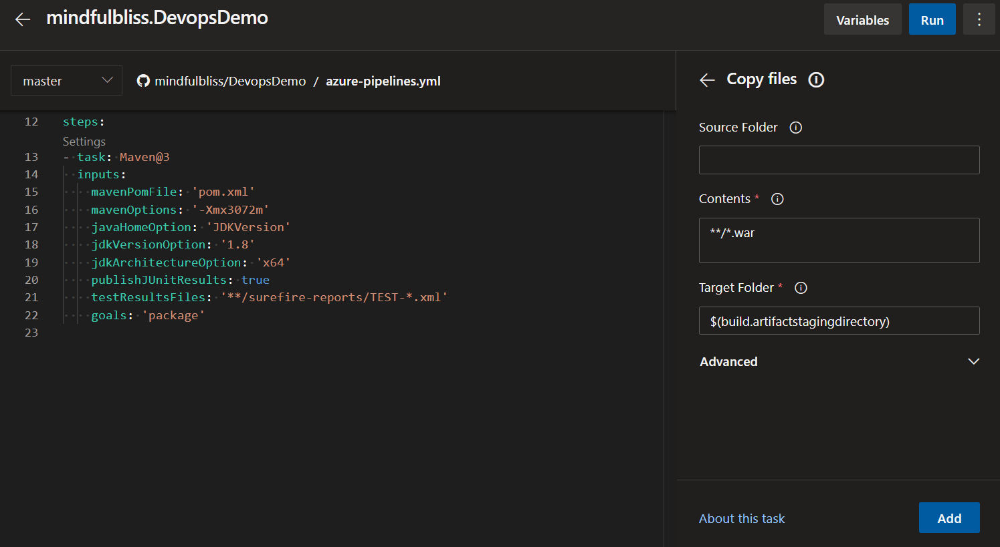



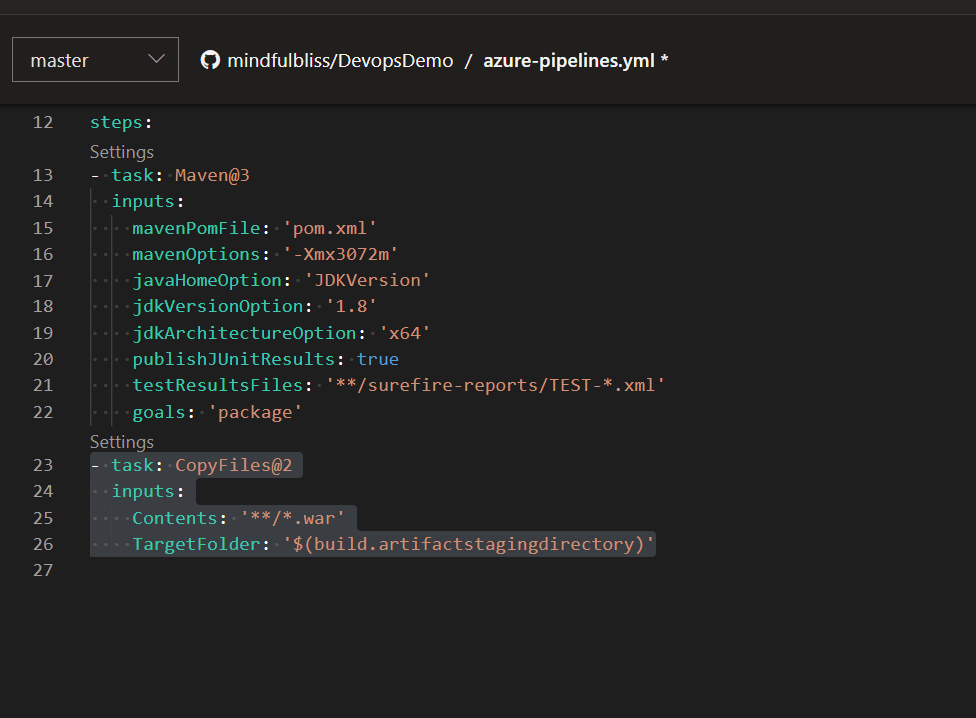

25. Now our code is in artifact directory, we need to push this further in our Azure devops project.

26. In the same edit pipeline search tasks search "Publish build artifacts" , it will autpopulate artifact staging dirc as path to publish, give a suitable "artifact name" and the artifact publish location should be "azure pipelines"

IT should looks something like this image

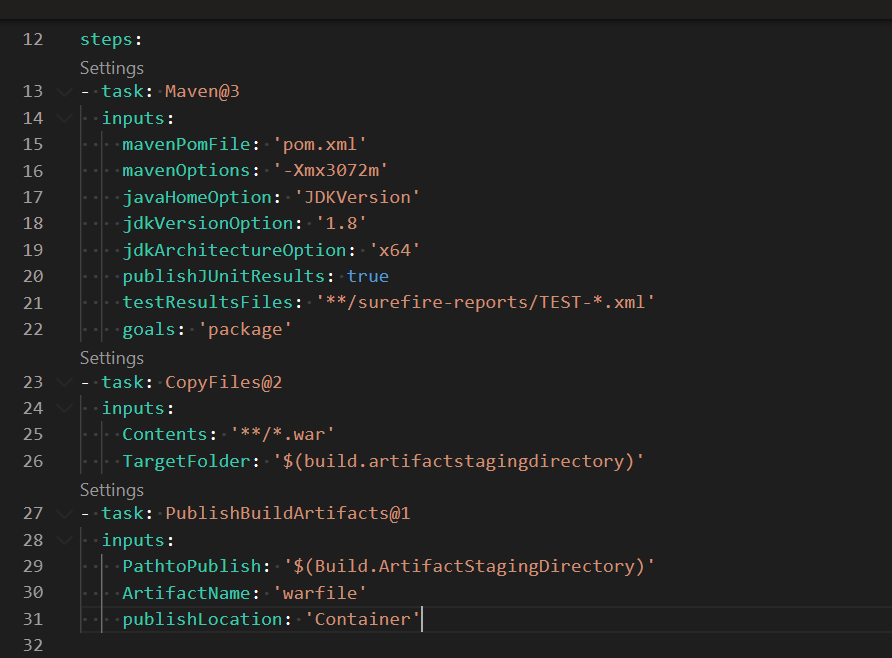

27. Click on Save and it will commit the updated .yml file to git repo again with suitable comments. select master branch

28. Now click on Run pipeline select master branch
Notice we have two additional tasks

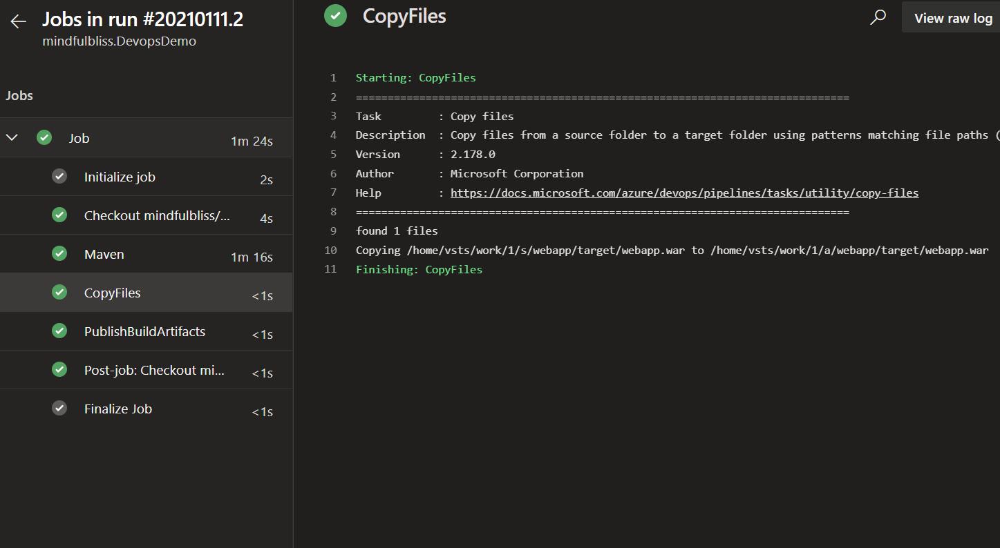

29. The artifact is published in Azure Devops and can be viewed under the Published artifacts

30 Now that our pipelin is ready ,we can see how CI works i.e on every commit made into the github repo, a build should published to Azure devops project.

refer image

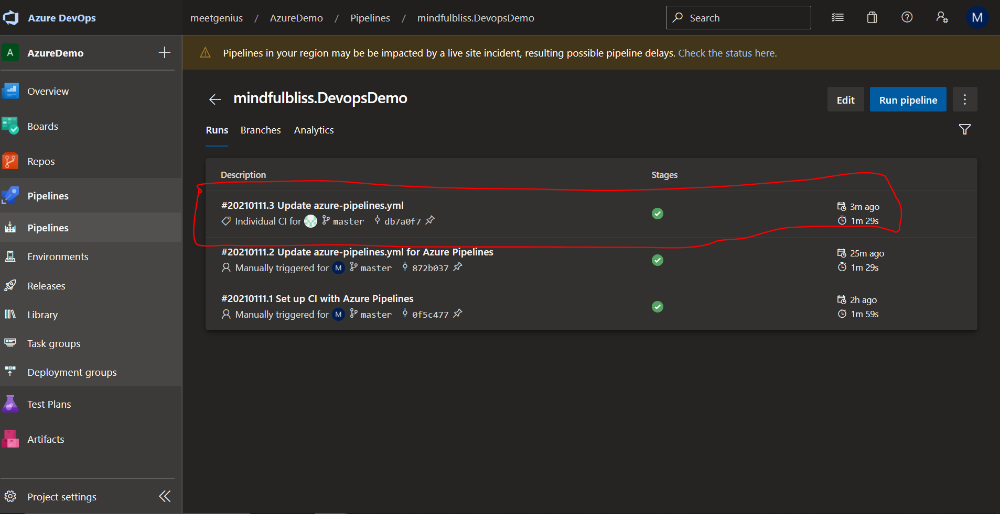

### HOW TO CREATE A RELEASE PIPELINE

1. Under the AzureDevops > Pipelines, go to Releases and click on new pipeline

2. A new release pipeline page is displayed

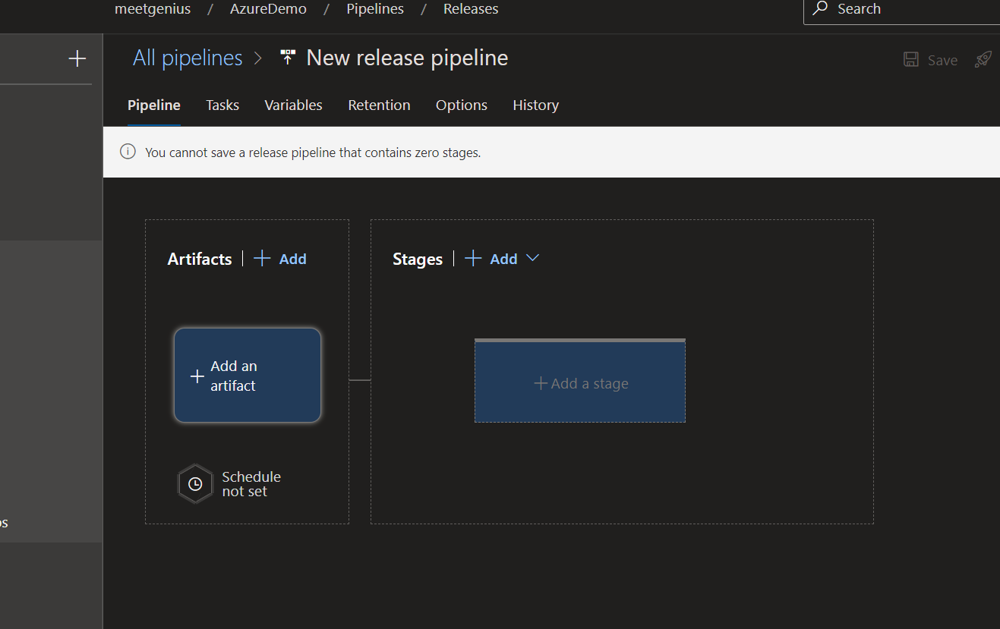

3. Click on "Add a stage"

4. Select from the template (our case Azure app service deployment)

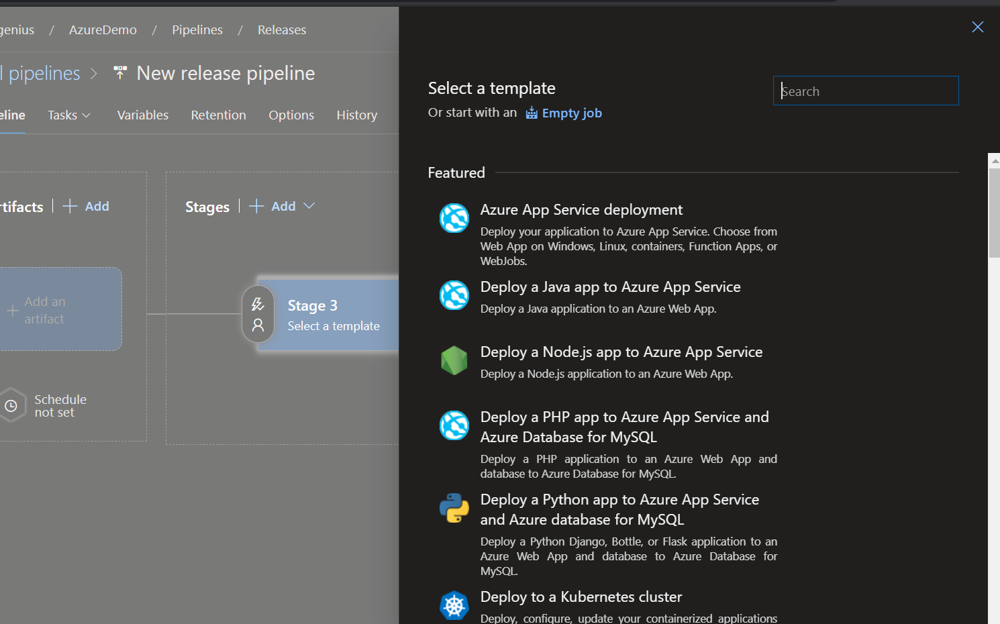

5. Rename the "Stage name" as QA environment.
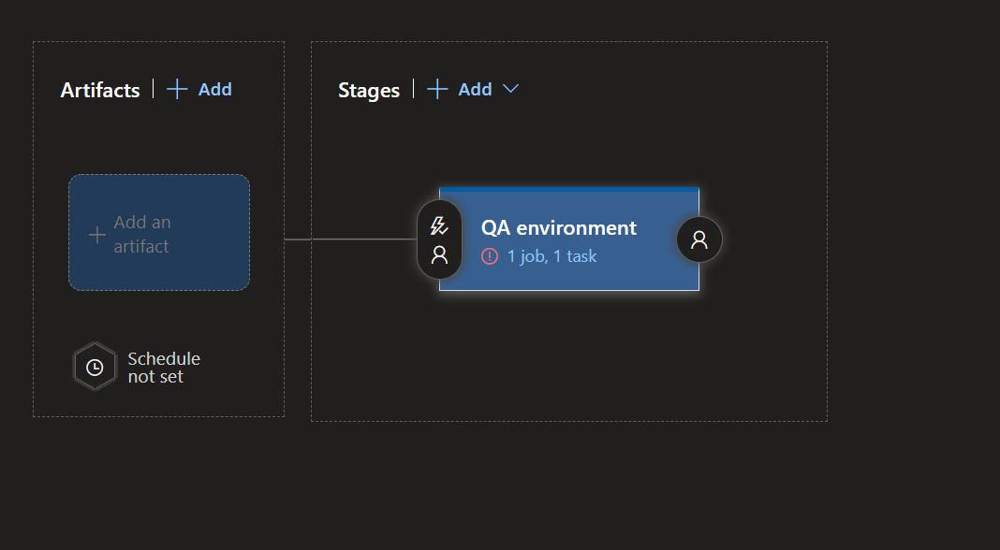

6. Click on the 1 job, 1 task
7. Here it will ask for azure subscription
8. Go to portal.azure.com, create a free trial subscription and then create a resource as azure web app with requirements, here our requirment is it should be a linux machine, with java 8 and tomcat 9

9. once the resource is deployed and up and running , go back to Azure dev ops

10. From the Azure subscription dropdown, select the subscription created, it will ask to authorise for first time, sign in with azure account details

11. Once authorisation is successful, the select the app type  as Web app on Linux( our case its Web App on Linx refer step 8)

12. Select the app service name it is same as the resource name created in step 8,9

13. Now half work is done, we have a application server ready, next step is to deploy the artifact from Devops demo artifacts to this application server.

14. So select the "Deploy Azure App service"

15. Under the package or folder enter the path for .war file or simply give as  " $(System.DefaultWorkingDirectory)/**/*.war "

refer image

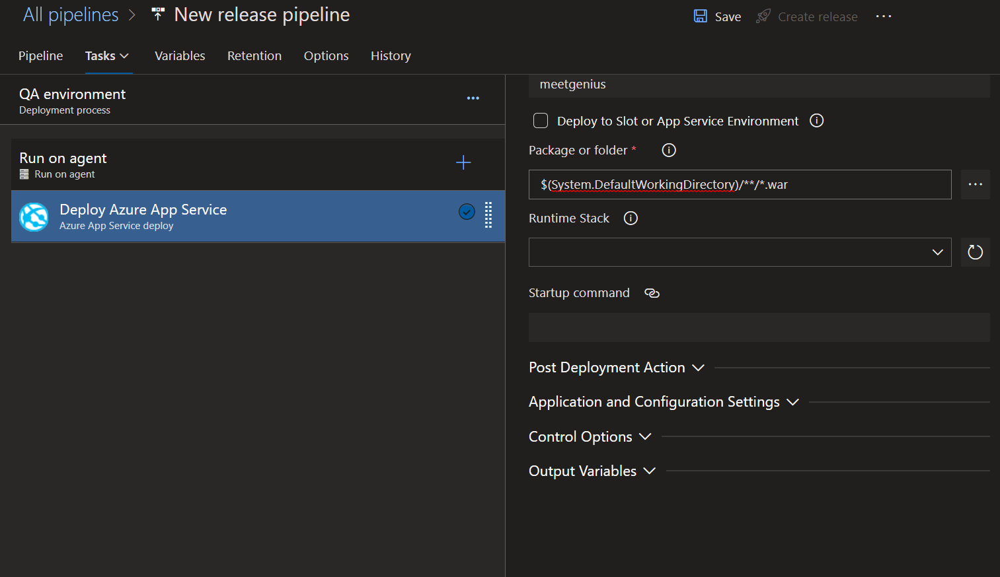

16. now if we hit the url " https:meetgenius.azurewebsite.net/webapp http 404 - not found error is dispalyed as artifact is yet to be deployed

Refer image
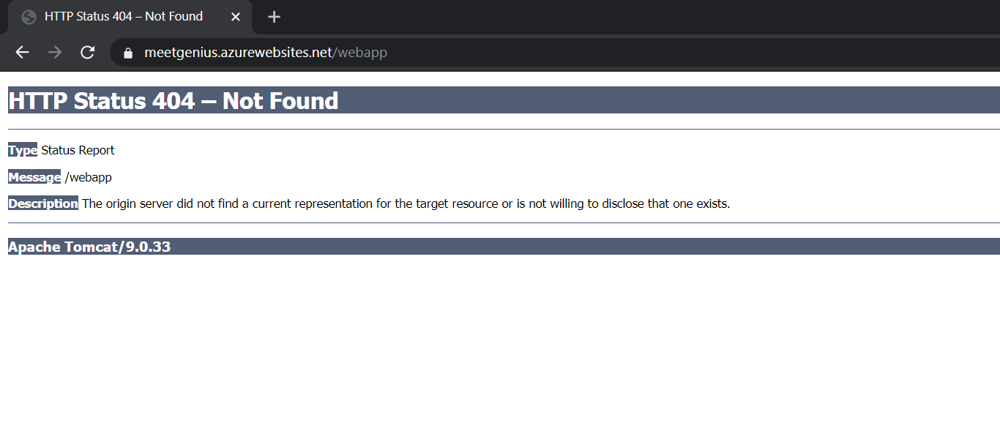


17. Edit the pipeline name ourcase "Deploy QA "and click on Save

18. Go to the Pipeline tab beside the Tasks tab, now here we need to give details of the artifacts to be deployed.

refer image

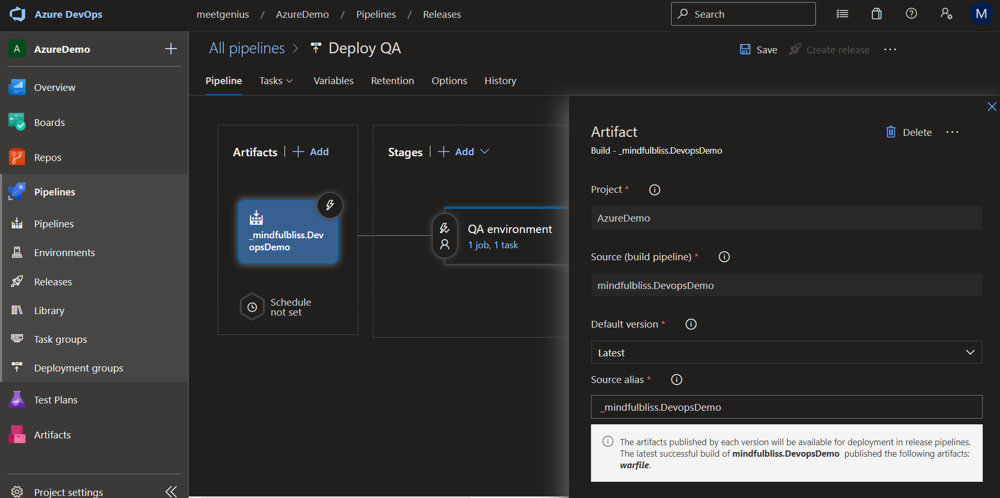

19. We can now see both the build and release pipeline

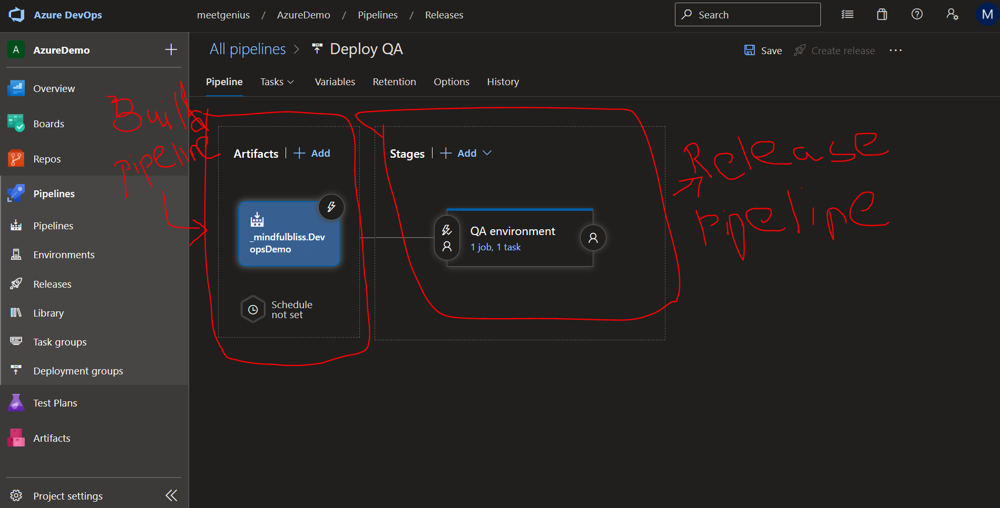


20. Save the project. Now we need to look into the Create release

21. So what is a create release, it is nothing but end to end pipeline (connecting build and release pipelines) for CI/CD implementation.

22. Click on Create Release, give suitable release description. You will get a message 'Release -1' has been created. Refer image the build file/artifact/.war file is successfully deployed now on to the application server( ubuntu linux having java and tomcat) on an Azure host.

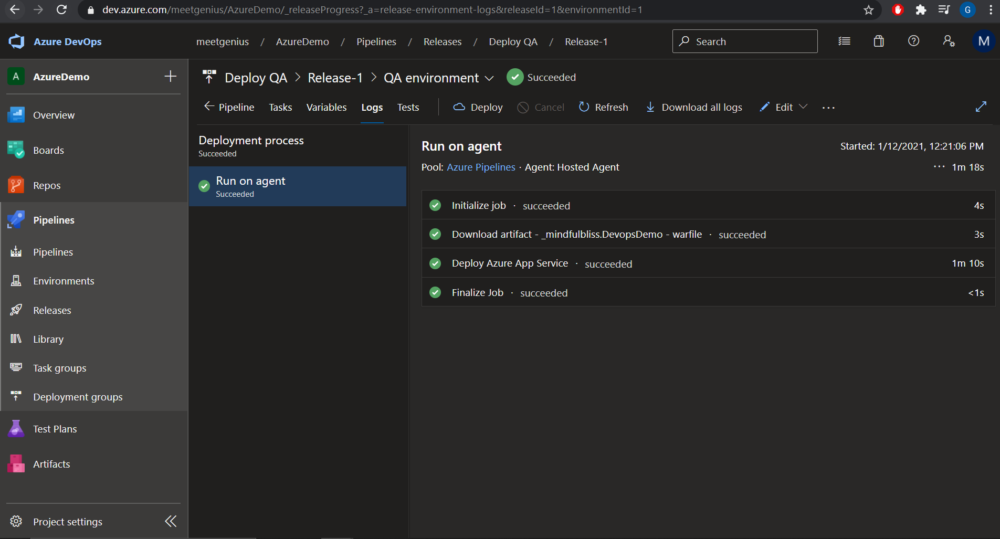

23. Now refresh the url "https://meetgenius.azurewebsites.net/webapp/" deployment is successful.

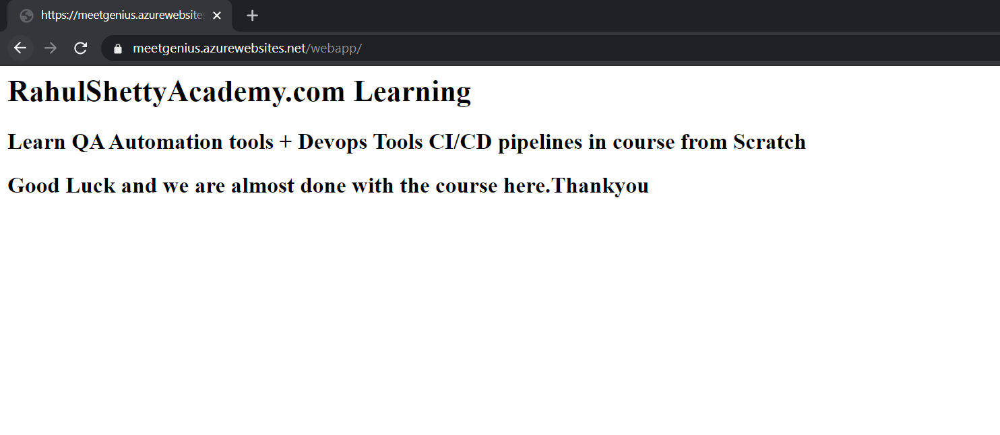



24. Now go to Releases sub menu under the Pipelines Menu, here the release pipleline Deploy QA is shown along with the number of releases done through it.

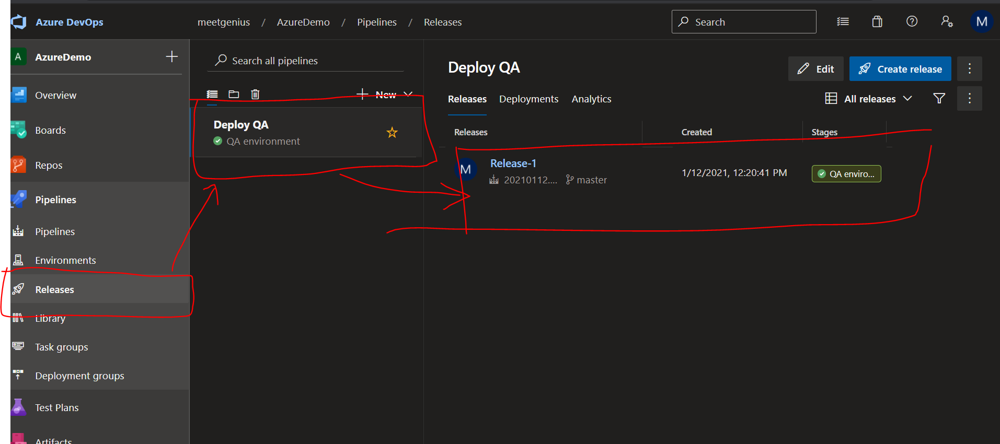

25. Now our goal is to achieve continous delivery i.e whenever a code change happens a new artifact is generated and that artifact is automatically deployed on the server.

26. Go to Releases, select the release pipeline our case Deploy QA and then click Edit

27. Now click on the "Continous Depployment Trigger" on the artifact. refer image

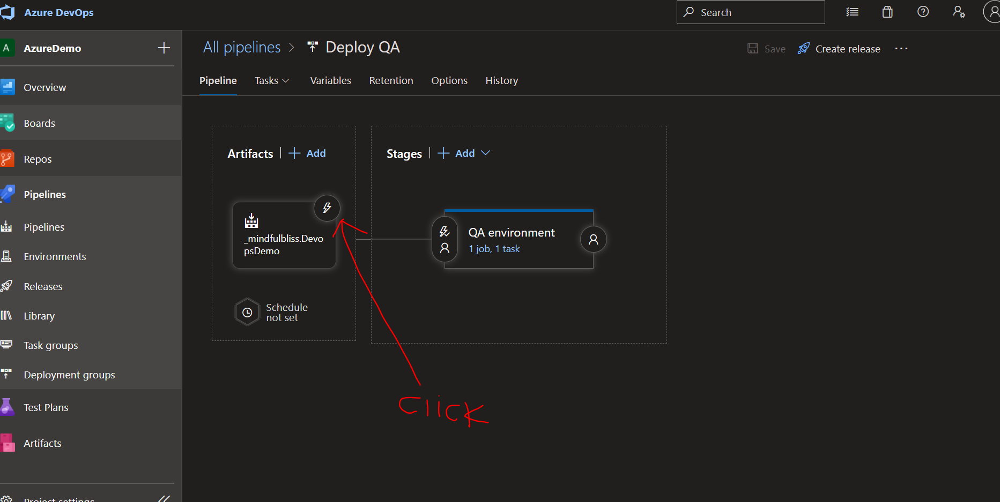


28. Click Enabled for Continous Deployment Trigger and Save it.

29. DEMO TIME FOR automated CI/CD pipelines. Update code in github and verify text change when compared to step 23 

refer image

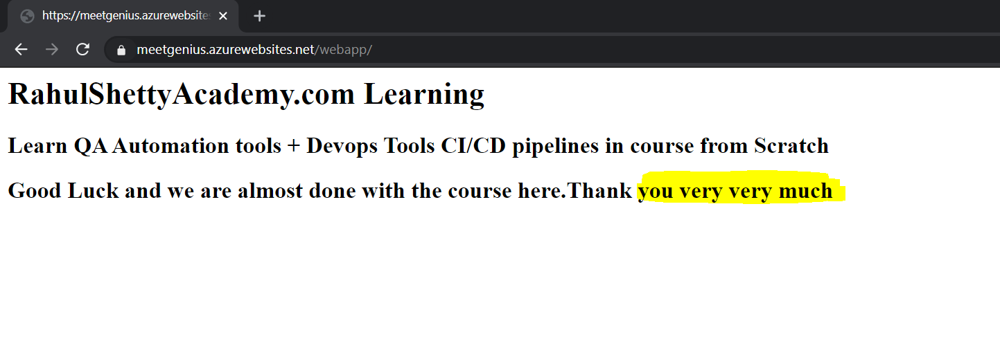

## RUN AUTOMATED TEST CASES ON ARTIFACT DEPLOYED ON QA ENVIRONMENT.

30. **PLEASE NOTE** that we have automated the deployment to QA environment and not yet to production

31. Now run automation test cases on code deployed in QA environment and if all the automation tests pass then we are good to deploy the code in production so that end users can access it.

### IMPORTING GIT REPOSITORY OF AUTOMATION PROJECT TO AZURE REPOSITORY
32. Now Got to Repos and Import repository by providing the clone url link

33. Code is now available in Azure Repository

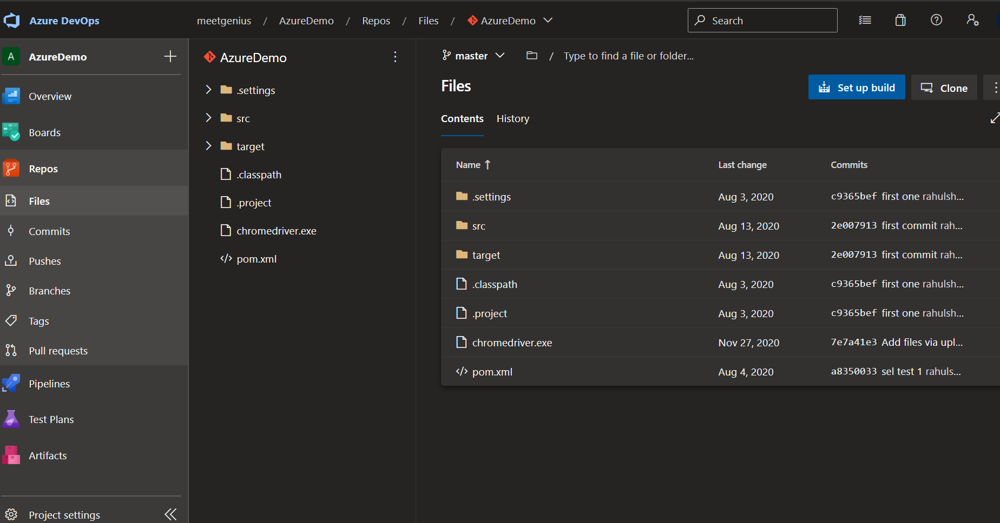


### CONFIGURATION TO ADD TESTS FROM AZURE REPOSITORY TO RELEASE PIPELINE

34. Got to Releases ,select the release pipeline click on Edit 

35. Click on Add a stage in release pipeline.

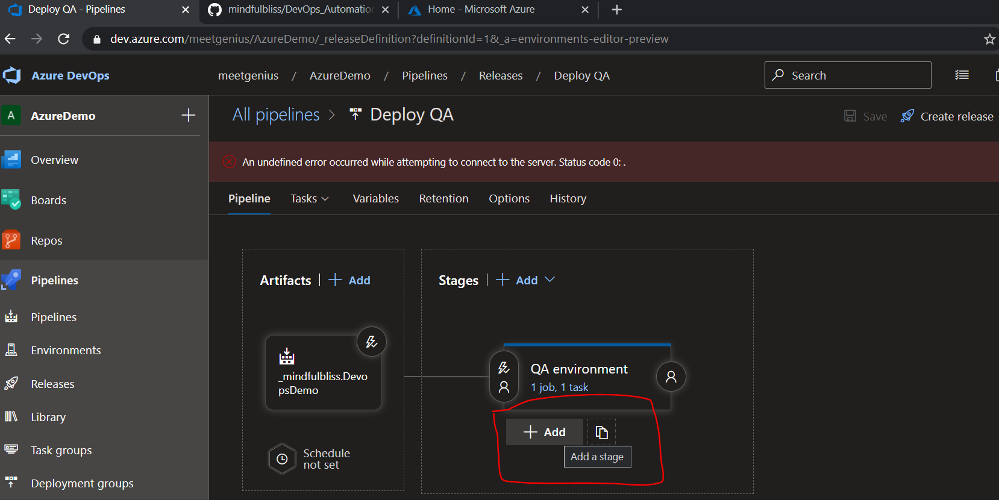

36. And select "Empty job" in template

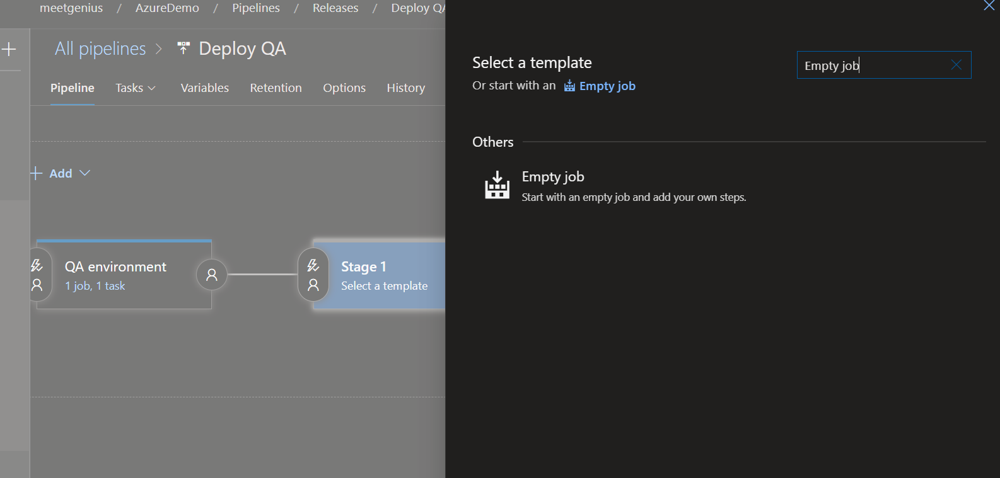

37. Give suitable stage name to the empty job 
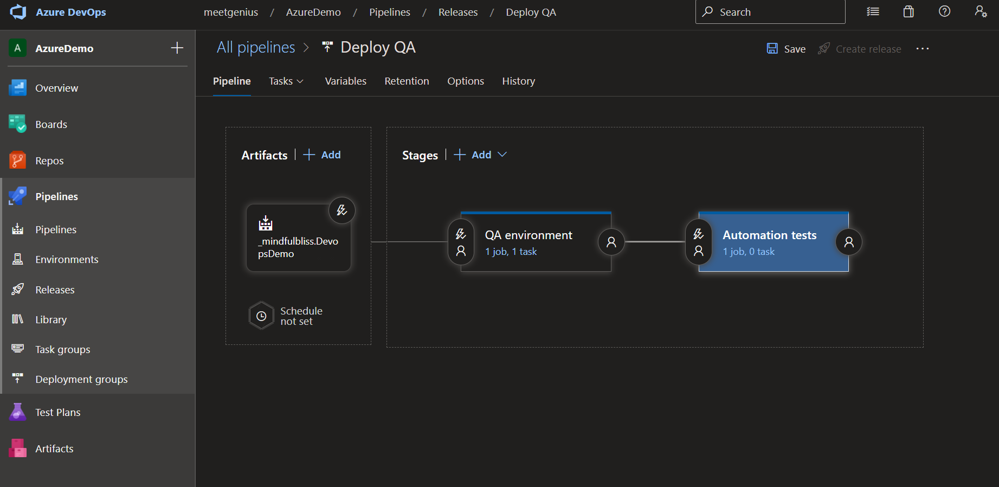

38. Now the above Automation tests should have access to the code where tests reside in our case it is th Repos that we created in step 32,33

39. From the above diagram it is clear that all information related to code, comes from Build pipeline i.e the artifact that we added. 

40. Now we need to add another artifact and create a job such that code from repos are available in the new artifact.

41. In the artifacts click on Add , then select Azure Repos, select Project, source(repository), default branch, default version is autpopulated, and click on Add.


refer image 
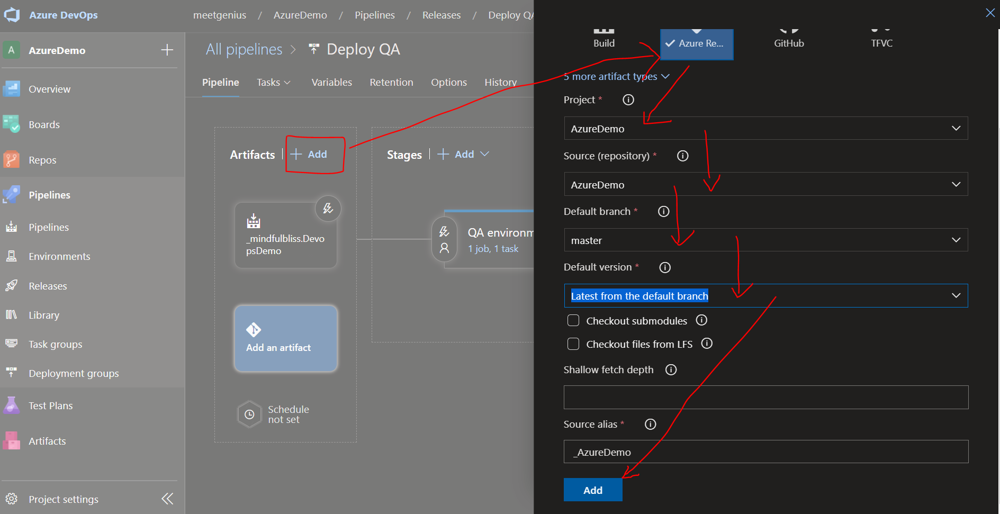

42. New artifact is added , we now need to config the job in Automation Tests stage to access the code from the newly created artifact.

43. Click on Automation Test job link

44. On the Agent Job, select Add a task to the agent job

45. In add tasks, select Maven ,click add

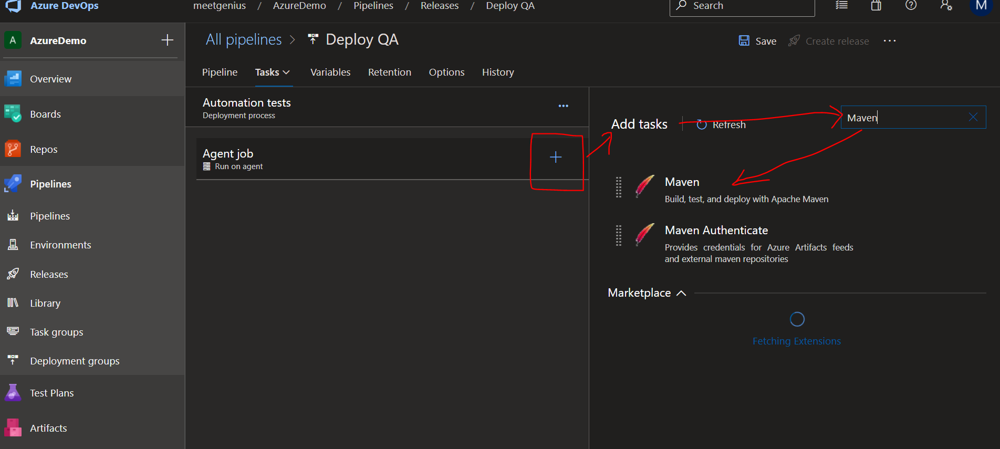


46. Maven pom.xml is displayed under Agent Job, select maven pom.xml

47. Now in Maven POM file specify the path where POM.xml is located by browsing through Linked Artifacts select the Azure Repository Git  (not Github)

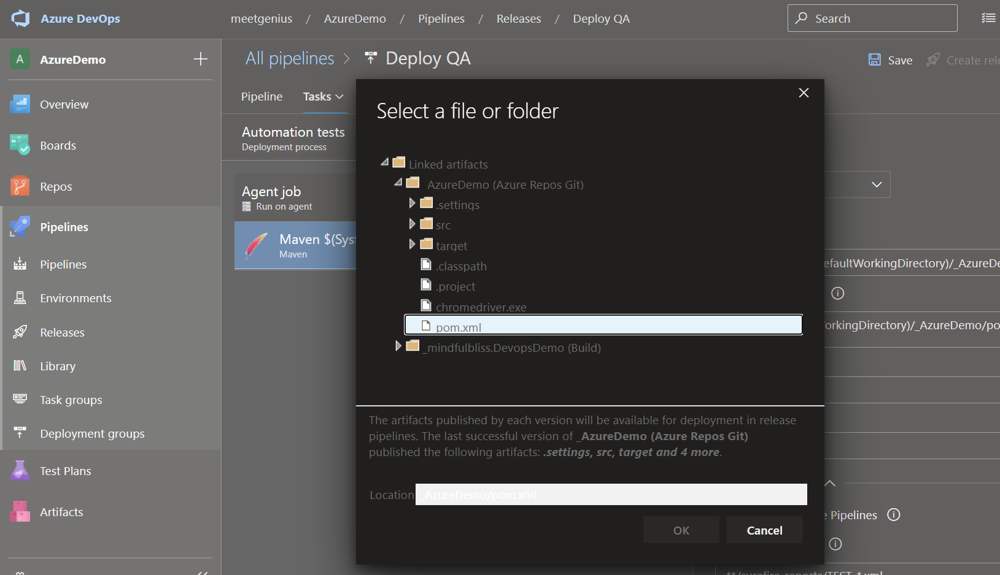

48. Now we have specified the location next step is to fire the command that will run the tess. In local machine we can run test with command maven test, here in Goal(s) we type "test" and click on Save.

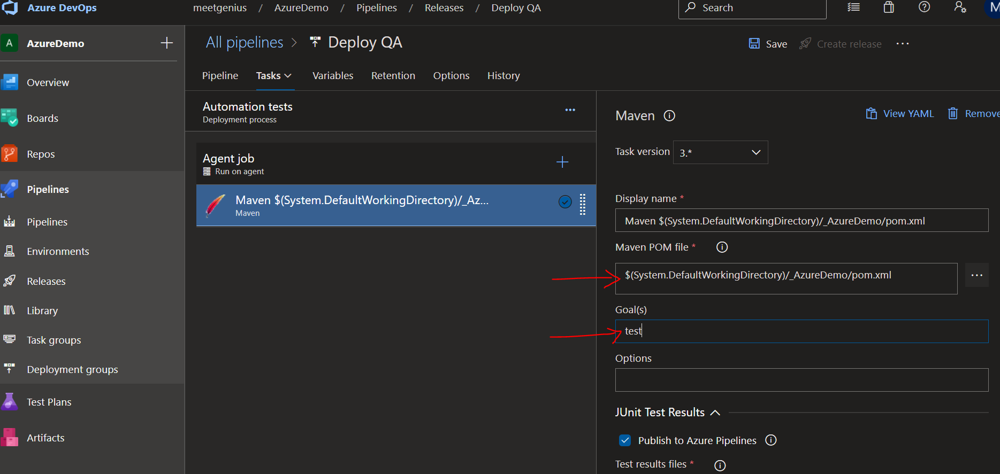

49. Now we are set all set to run the ci/cd pipeline, make changes in the code such that new build is triggered.

50. All tests are passed and now we are ready to release code into production for end users


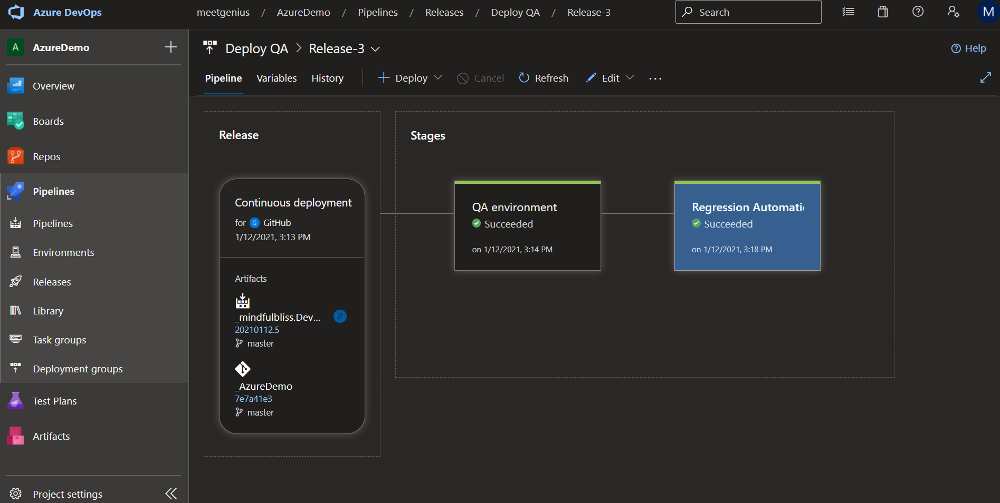



51. Renaming Automation test stage to a meaningful Regression Automation tests name

52. Renaming Deploy QA release pipeline to RSA project deployment giving meaning ful name

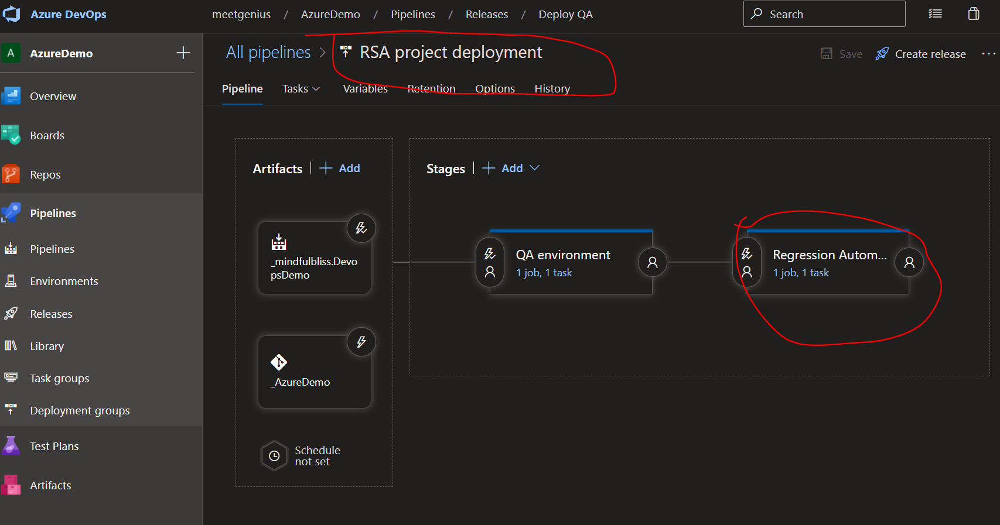

53. To release int o production select  add a stage after Regression automation tests

54. From the template select Azure app service deployment and give the stage a suitable name "Production deployment"

55. Select the task link under Production deployment

56.  Here provide details of the Production application server
if not created, go to portal.azure.com and create a new resource with linux,java 8 ,  tomcat 9
in our case prodmeetgenius and click on SAVE

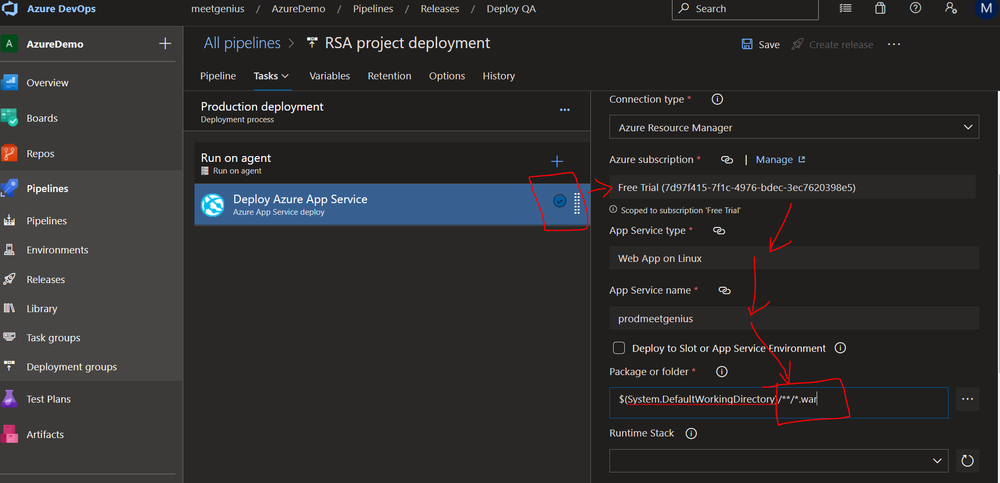




57. NOW PIPELINE IS READY FOR CONTIONOUS DELIVERY 
make a change in code and commit it which should trigger a new build/artifact/.war file in our case and deploy it to QA environment. Then automation tests would run on that QA environment, when all tests pass, the build is deployed for end user achiveing automated continoud delivery.

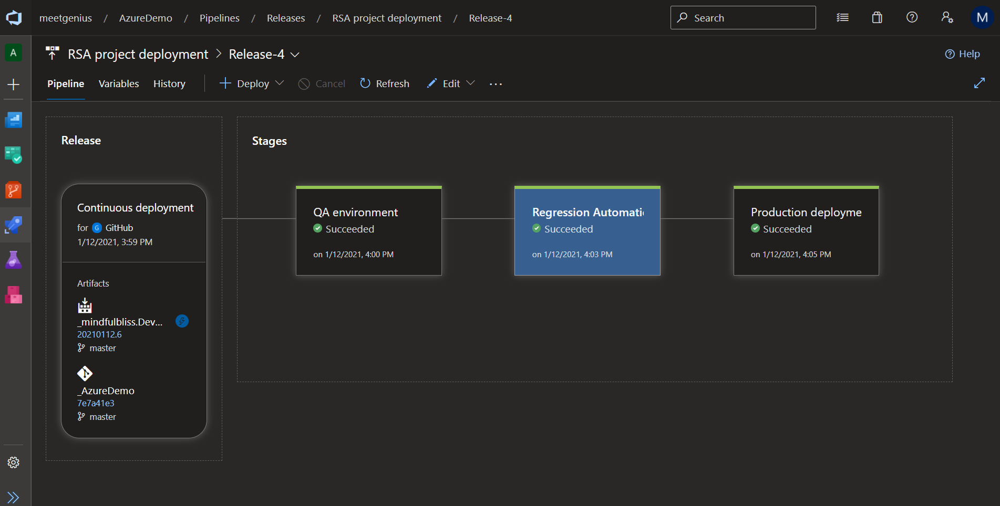

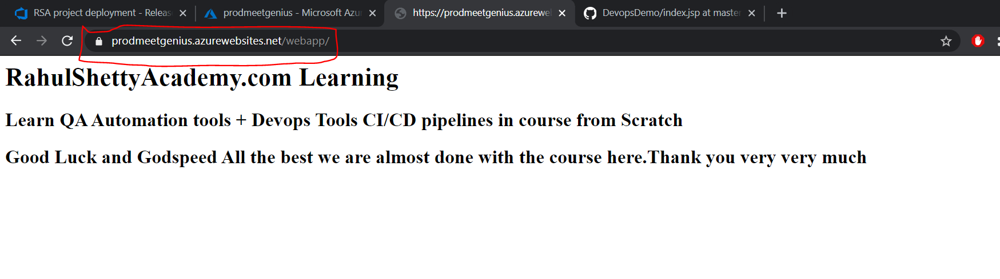

# DOCKER HUB INTEGRATION WITH AZURE DEV PIPELINES

## USING DOCKER FILE TO DOCKERISE THE CODE REPOSITORY



What does one mean by above heading?

Untill now we have seen that we have a Maven project which when built generates a .war file which is then deployed on Azure cloud via Azure Web App which is nothing but a  machine ( machine with Ubuntu (linux) os having java, tomcat). Here the deployment of java, tomcat on the machine is done by Azure web app autoamtically.

Now consider that we dont use the Azure web app option and we deploy want to deploy it to a linux machine. we need to manually install tomcat and java and other dependencies. This will be discussed later below.

For now lets concentrate on Docker.

To see our website live we need to deploy our war file to the tomcat server, for this we can create a docker image

for fundamentals on Dockers refer Dockers.ipynb notebook.

The Docker image will basically take .war file and deploy on tomcat in a virtual environment and not on a hosting server.

So what do we need to do
-> Find any machine 
-> Install docker
-> Start docker container
-> In the docker container deploy that docker image, so we can see the site live on that machine without worrying about installing tomcat

Docker image is created using Docker file whick looks for .war file and deploys to tomcat.

In our case Docker file is already created in the github project and check AzureDockerfile. 

Open the file you will see it gets tomcat first and then copies the file to tomcat webapps folder. This is the Docker image.

We will create a Docker image using AzureDevOps.

Also not that people do not directly deploy images on the machines, but rather follow the way of github repository, where the docker image is checked into the docker un (hub.docker.com). Docker hub stores all the images.  
From docker hub  the image is pulled onto the machines where it is to be run.


===> Our goal now is to create a docker image using AzureDevOps and push it docker hub for future use, so that when ever needed to release ppl can download it run it ,test it and release it to production.







1. Create an account on the docker hub. meetgenius@gmail.com/Docker@123


2. Create a new repository (our case meetgenius/azuredevopsdockerdemo )

3. All the code written is  build and along with its dependencies mentioned in the docker file located at github in mindfulbliss/AzureDevOpsDockerDemo repo

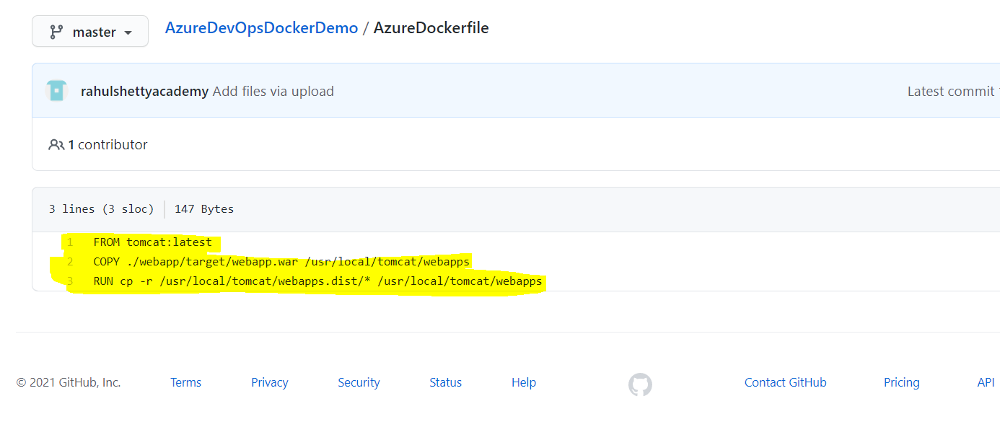

4. Now go to AzureDevops portal > PipeLines, New Pipeline, Where is your code? select github (yaml) , select the repository (our case mindfulbliss/AzureDevOpsDockerDemo) it will ask for github password and install some software for this repo then will get redirected again to dev.azure.com

5. In Configure your pipeline option select "Maven" (because we first want to build the code and then copy it to docker hub )

6. First step of build is done in the yml refer below figure

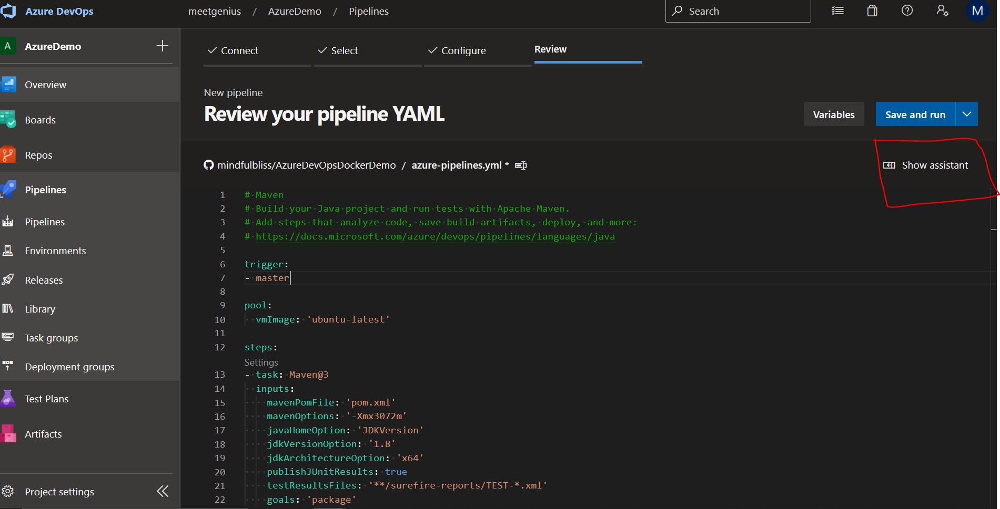

7. Now click on "Show assistant" and in the serach task field enter "Docker" and options are displayed.

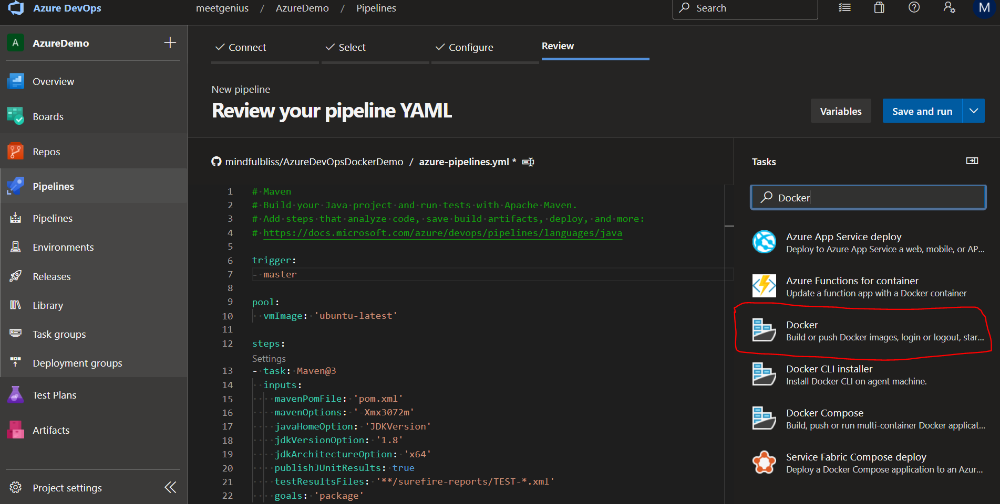

8.  Select Docker highlighted above, now we need to push this to docker hub but Azure devops is not aware of our docker hub repository also azure dev ops need authentictation of our docker repos.

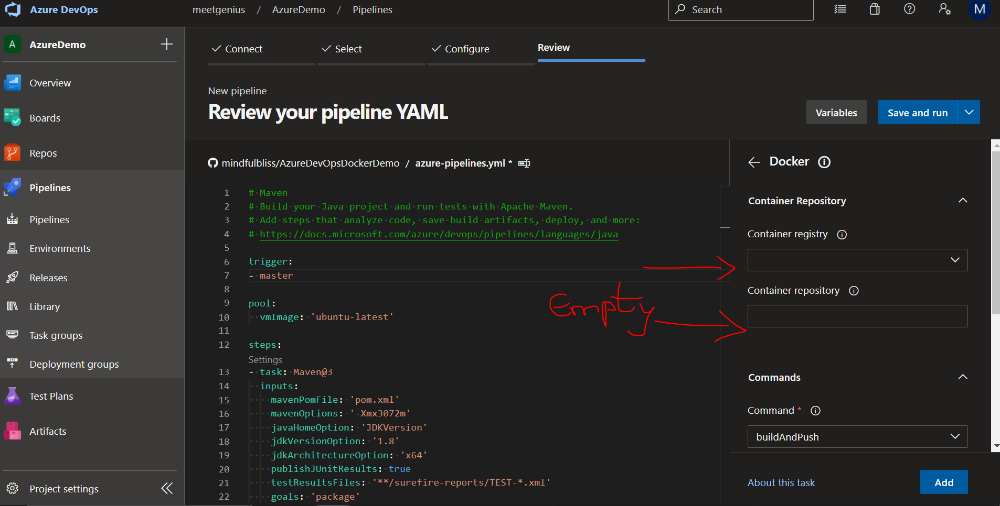


9. Go to AzureDevops Project Settings Option on the Left Menu Bar
 
10. Then navigate to Service Connections, in this click "New Service connection", search for "Docker Registry" select it and click Next.

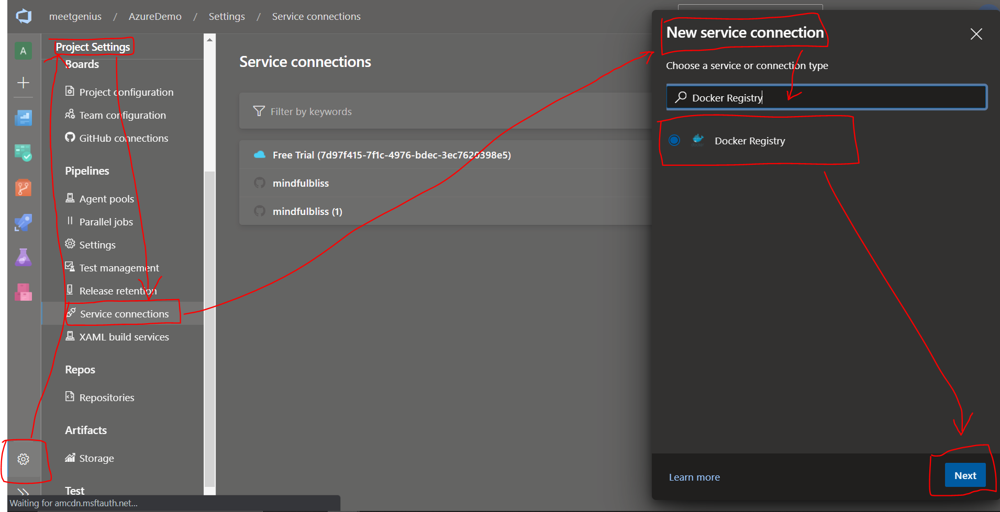


11. In the New Docker Registry Service connection, select Registry type as "Docker hub". Docker id (our case its meetgenius) and docker account password (Docker@123), click on verify

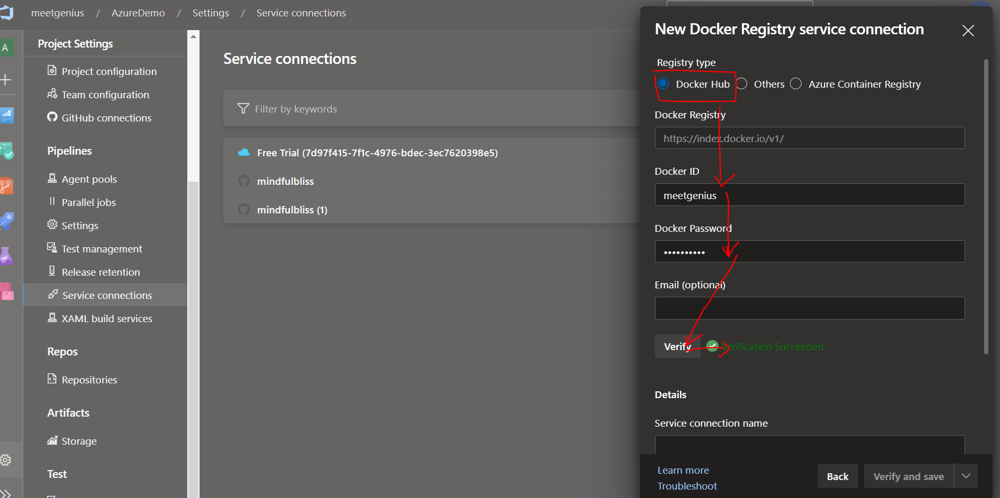


12. After successful validation, provide a service name () and click verify and Save

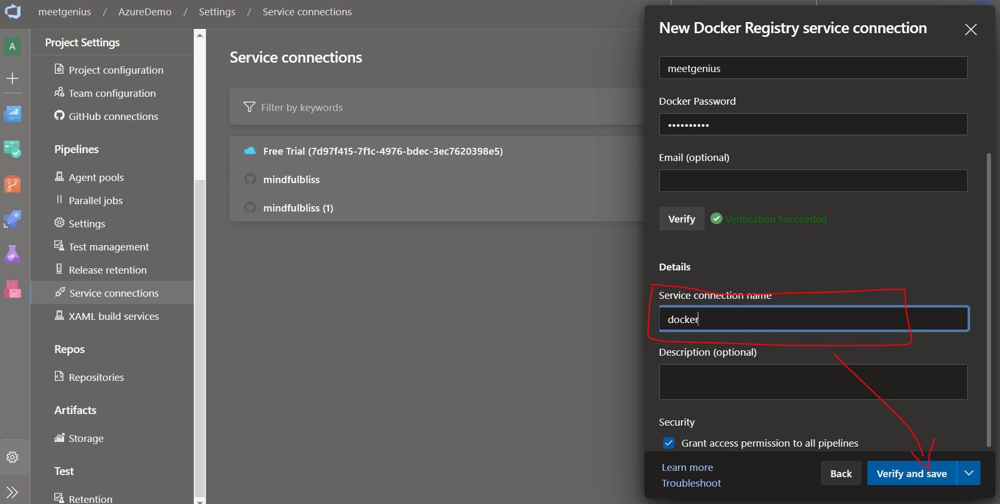

13. Now Azure Devops portal has knowledge about the Docker hub

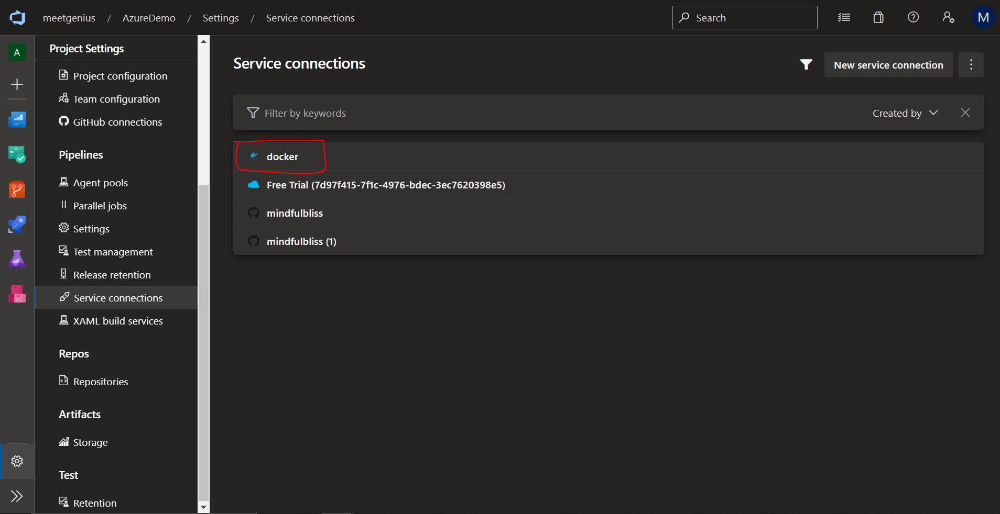

14. Continued from Step 8 
Enter details for Container Registry and container repository as shown

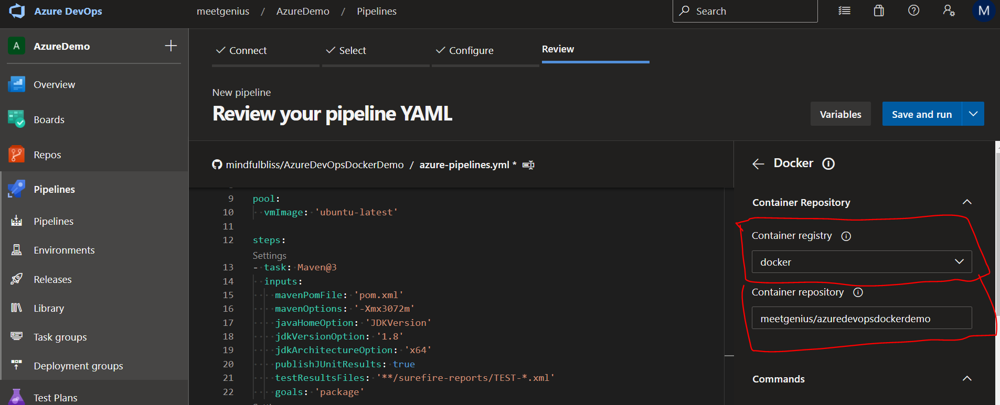

15. In Commands  we first need to login, so select Login and add task

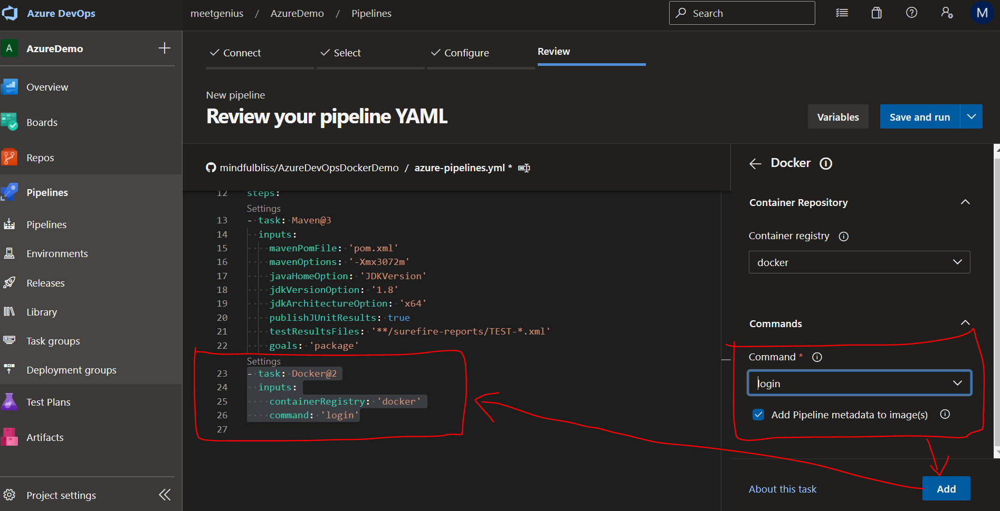

16. Again Search Tasks, again Docker and provide same Container Registry and Container Repositry details, now in commands select "BuildAndPush", In Dockerfile field we need to give the Docker file name from out github repo (AzureDockerfile)

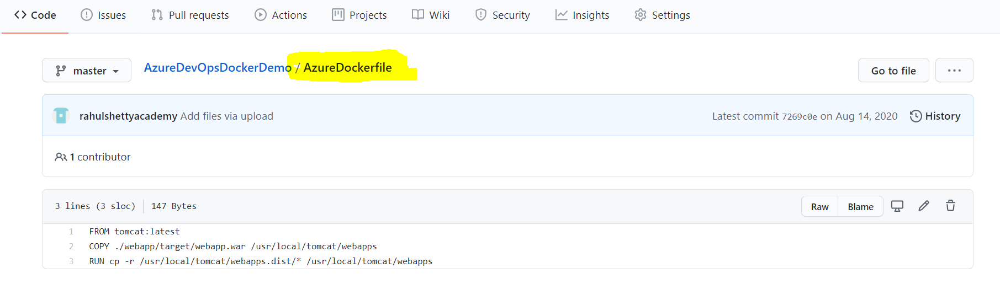

17. Refer this image for step 16
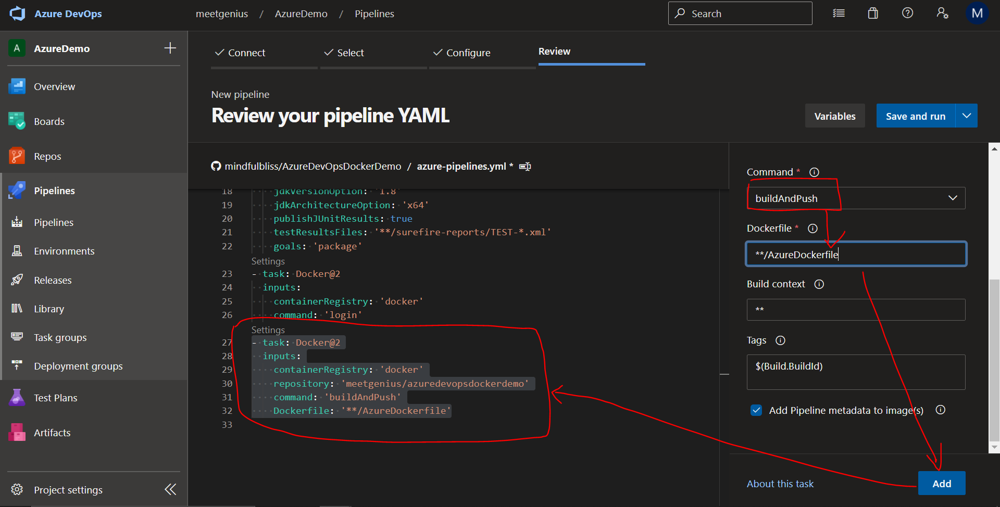

18. Now Click on Save and Run, this yaml file will be first checked into the git hub repo and then build will be generated and then pushed to the Docker hub repository.

Refer below Screenshots

Github : Checkin of the pipeline.yml file 
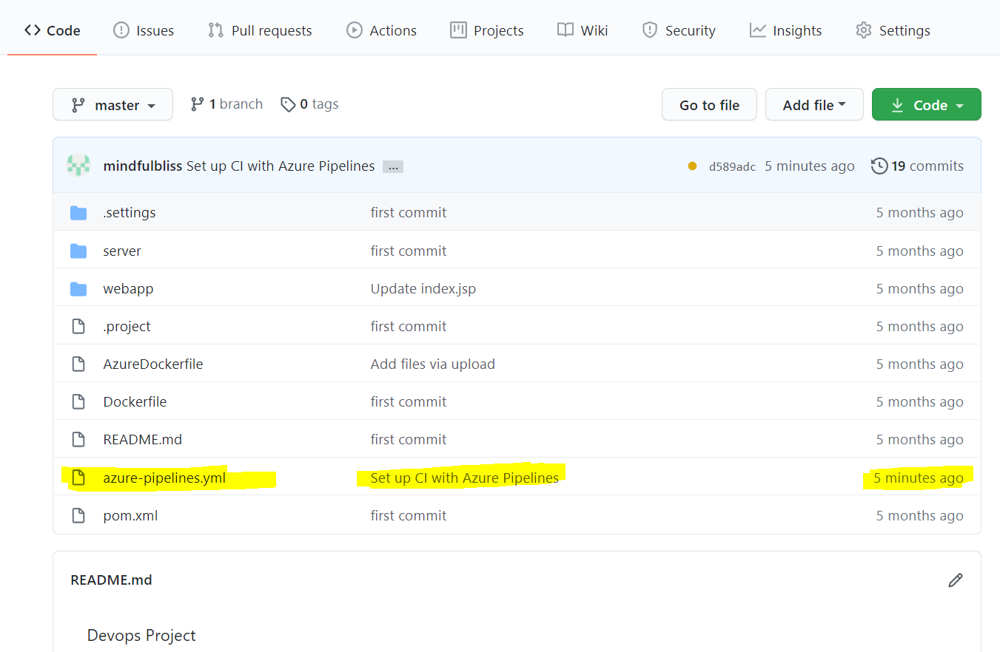

AzureDevops: Pipeline creating build and pushing it to Docker hub

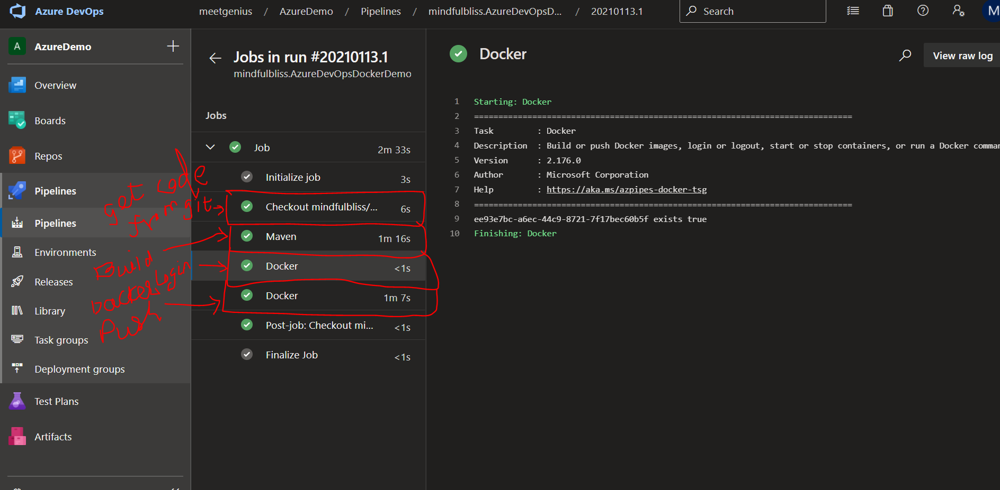

DockerHub : Build pushed to Dockerhub repository 

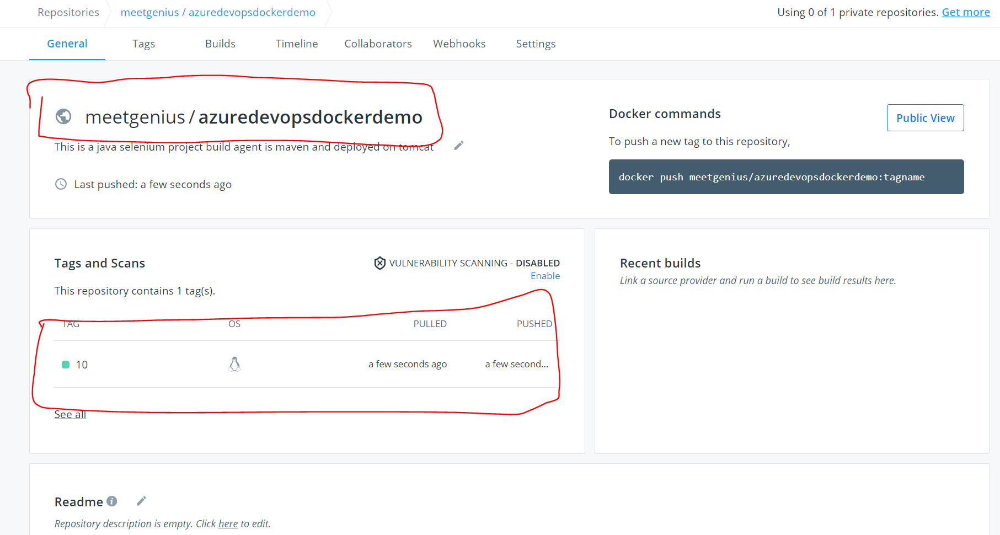



18. Now to check whether CI is working or not, make changes in code in git hub and it should push new docker image in dockerhub.

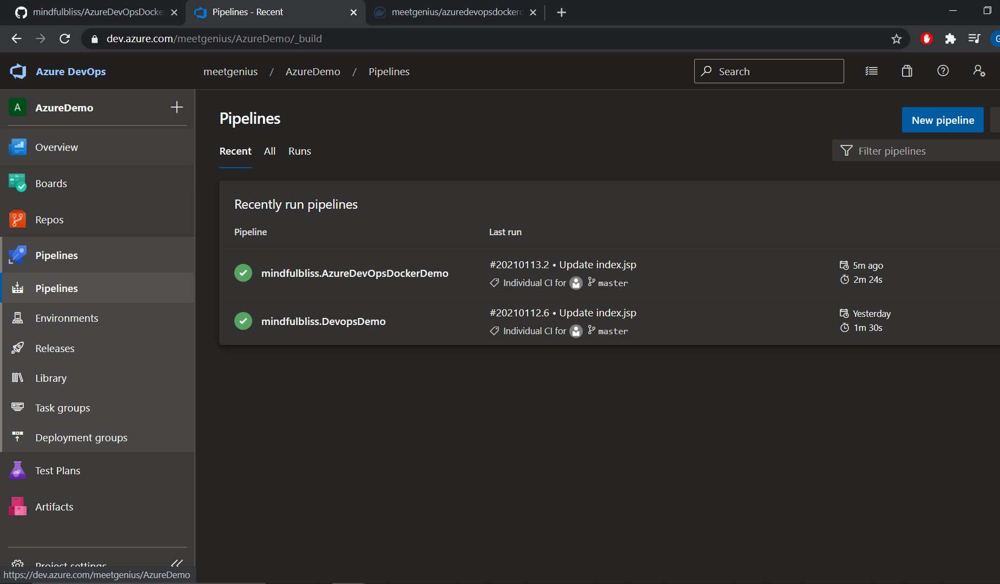

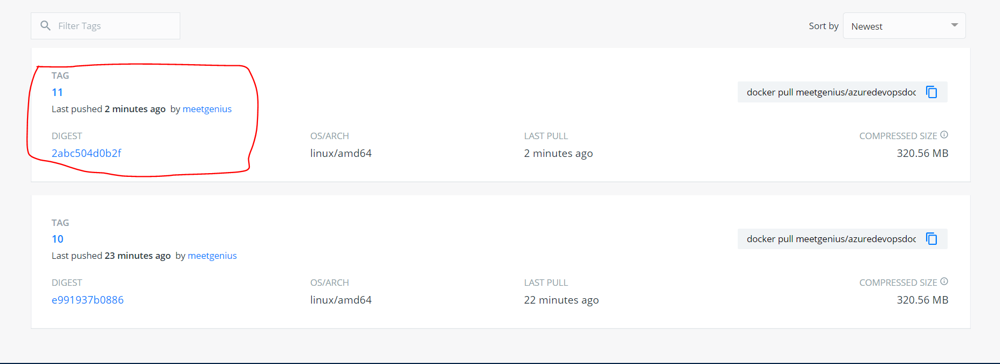

## DEPLOYING PROJECTS TO LOCAL MACHINE LIKE LAPTOPS, DESKTOPS, OWN SERVERS NOT HOSTED ON AZURE PLATFORMS USING LOCAL MACHINE AGENTS.


Untill now we have learned how to create a build pipeline, release pipeline to build,deploy, test ,release code on machiens selected via Azure App. 

Also we learnt creating a docker image and pushing it to docker hub from where we can deploy it on suitable machine. 

Now we will learn to use Azure Devops to deploy artifacts to local machines like laptops desktops or in other words to your own servers which are not hosted on auzre platforms.






1. Consider that your company has its own dedicated servers (not on Azure platform) we can still use Azure Devops to deploy it to your servers (local machines included)

2. We need to configure our own server in Azure Devops so that it can be deployed. This is called configuring agents

3. We need to register our local machine as an agent to Azure devops portal. Go To Project settings , Pipeline section, Agent pools, Add Pool.

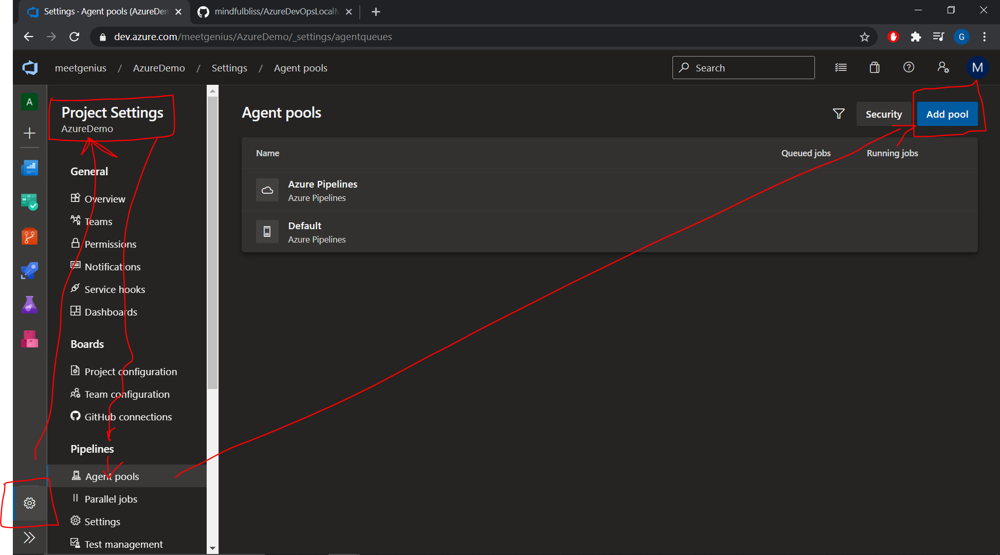


4. In Add pool , pool to link "New", pool type "Self-hosted", give a meaning ful name (our case "localmachine"), click on Create.

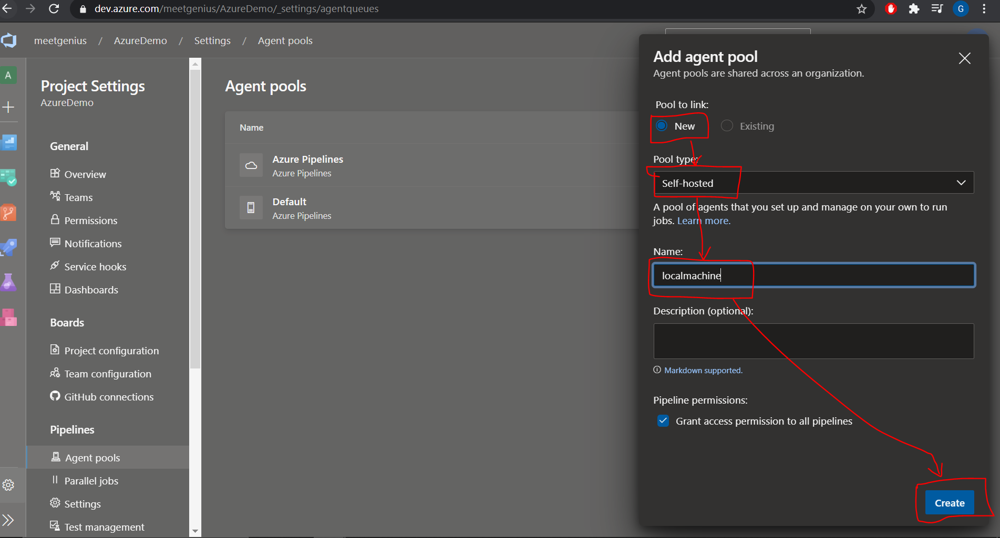

5. A new agent pool with name "local machine" is added 

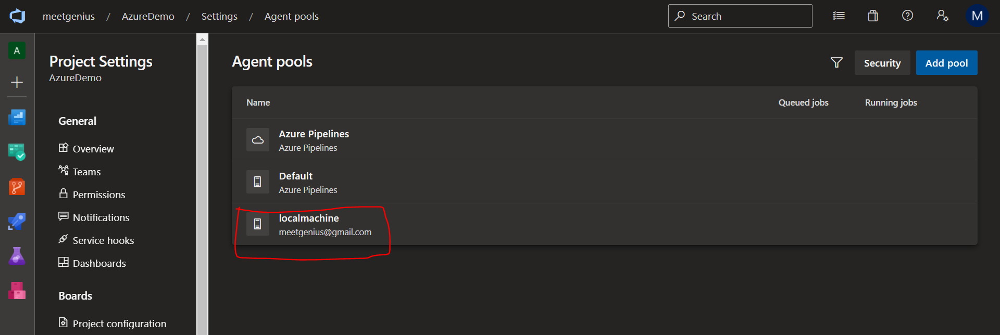



6. Click on the newly added agent pool (our case local machine), now in this pool we have to connect our local system. Select "New Agent" , a new floating window pop ups 

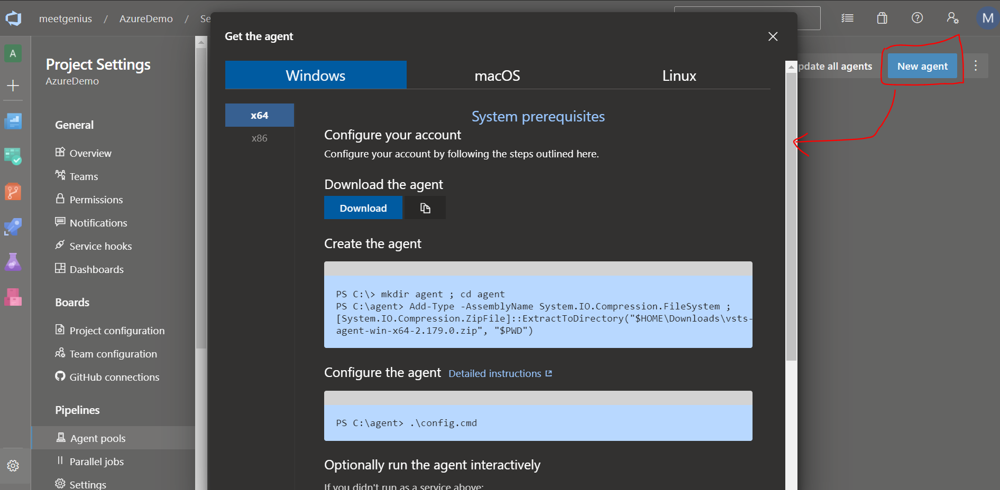


7. SELECT OS (our cae Windows, select X64), click "Download " in download the agent around 147 MB setup which is dowloaded in Downloads folder

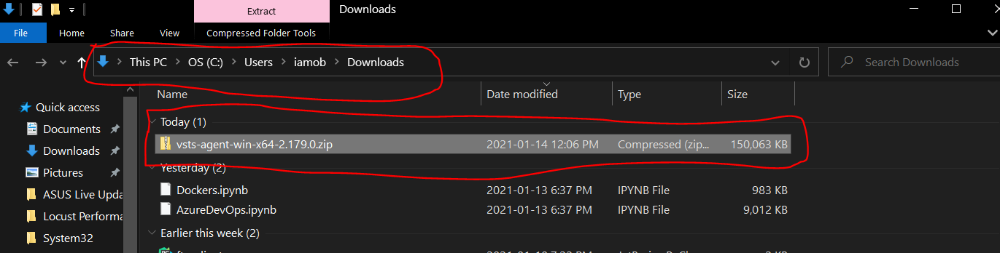



8. Open PowerShell in Administrator mode and type in teh commands mentioned 

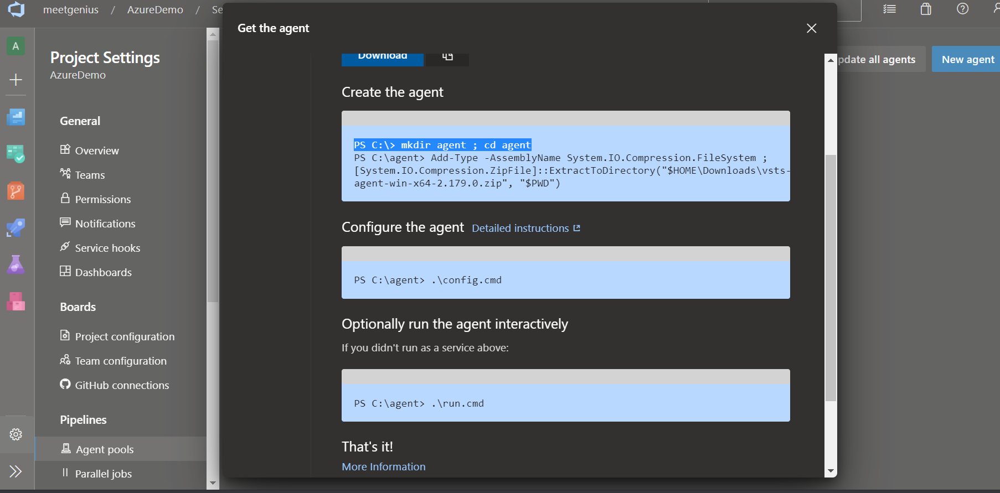

9. Once you are on the Configure the agent follow screenshot 


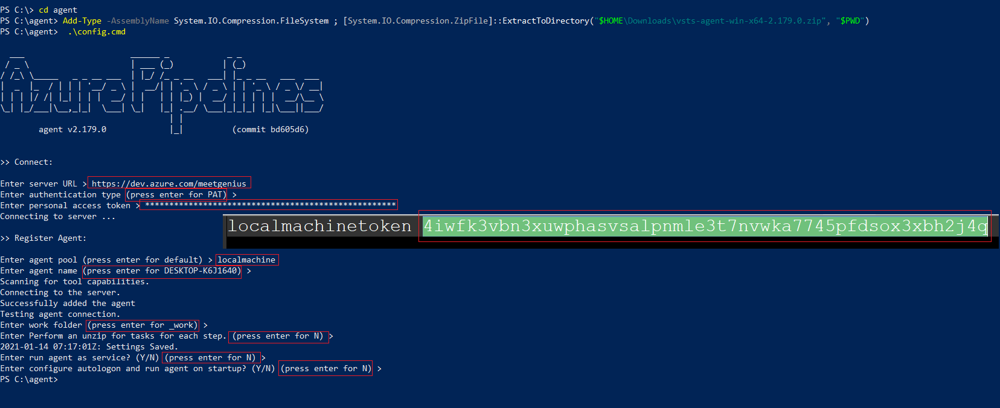

10. Now run the agent 

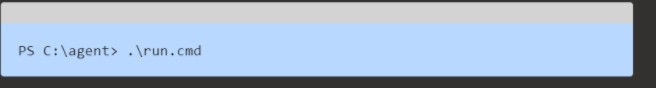



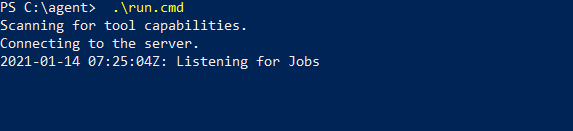

11. Above image means that our local machine is now connected to Azure DevOps and listening for any jobs. If Azure Devops assigns any work to this agent(localmachine) it will serve it 

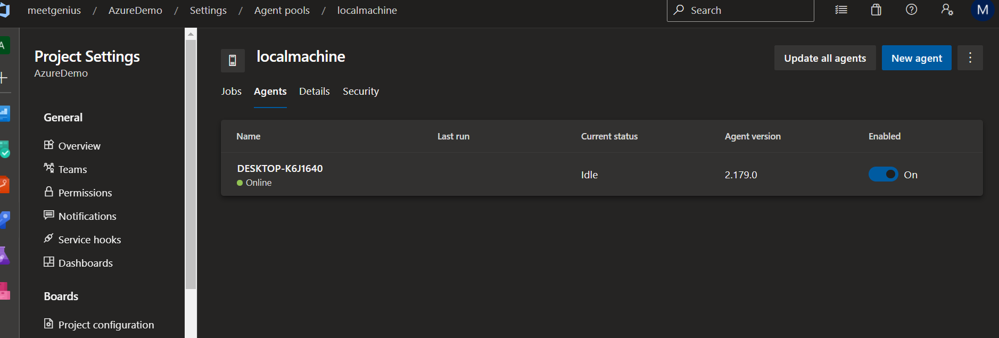

12. Similarly if you organisation has any dedicated servers, you can configure in above way


13. Now create a new build pipeline with repository (mindfulbliss
/
AzureDevOpsLocalMachineAgentDemo)

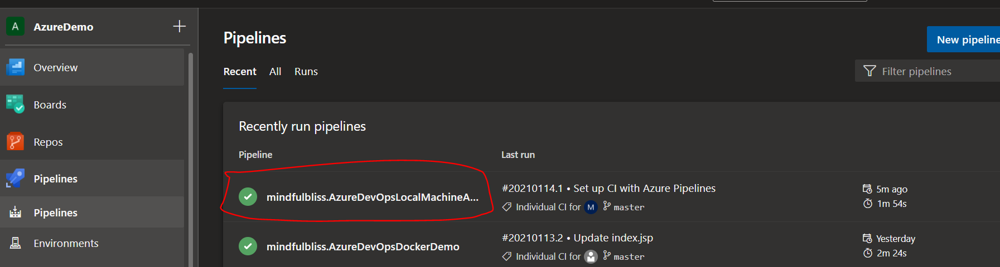

14. Now that build pipeline is created, we need to create a new release pipeline 

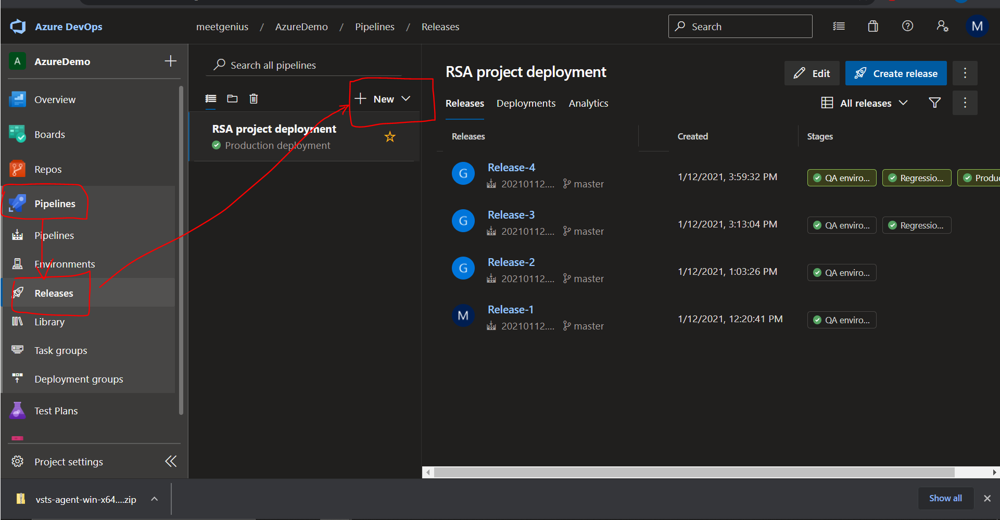

15. In New release pipeline, select empty job for now and give a suitable stage name ( our case MylocalMachine)

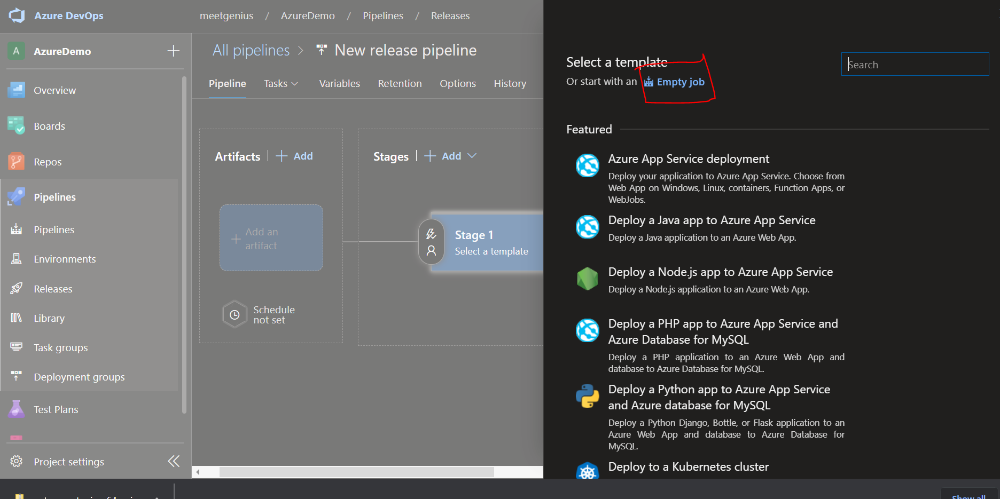

16. In MylocalMachine stage, select 1job,0task link and in Agent Job > Agent Selection > Agent pool select ("localmachine") 
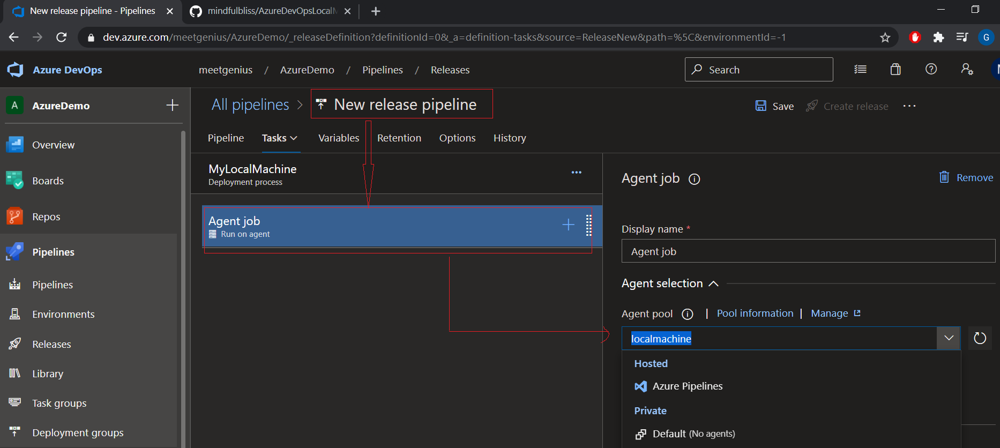

17. Now go back to pipelines and add an artifact 

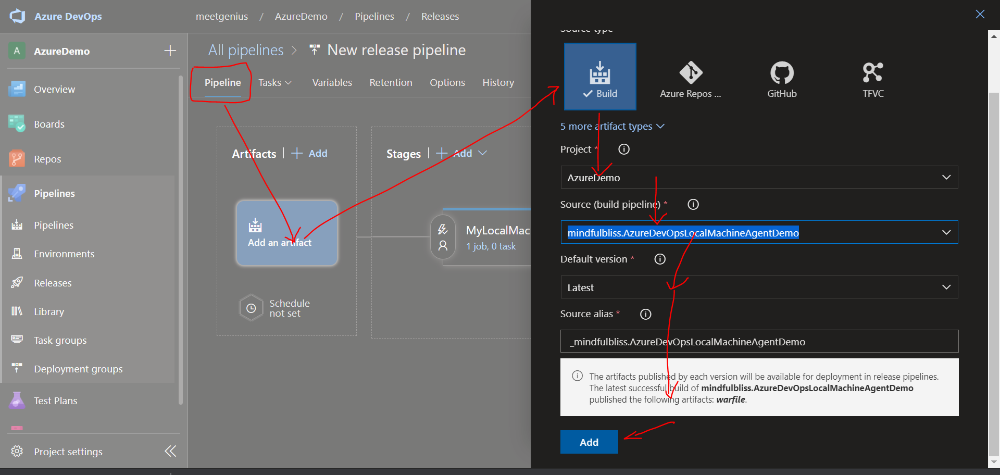

18. Enable contionous deployment Trigger 

19. Now go to MylocalMachine 1job,0task link and the artifact is auto selected. Click on save.

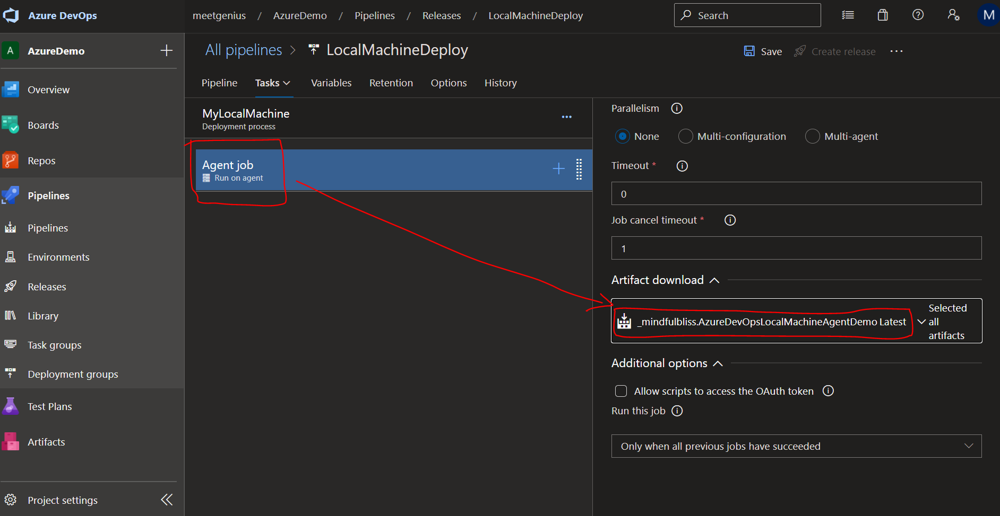

20. Now the pipeline will select the artifact and deploy it in agent pool on local machine.

21. But where in agent pool will it deploy ?

22. Click on create release and click on deploy

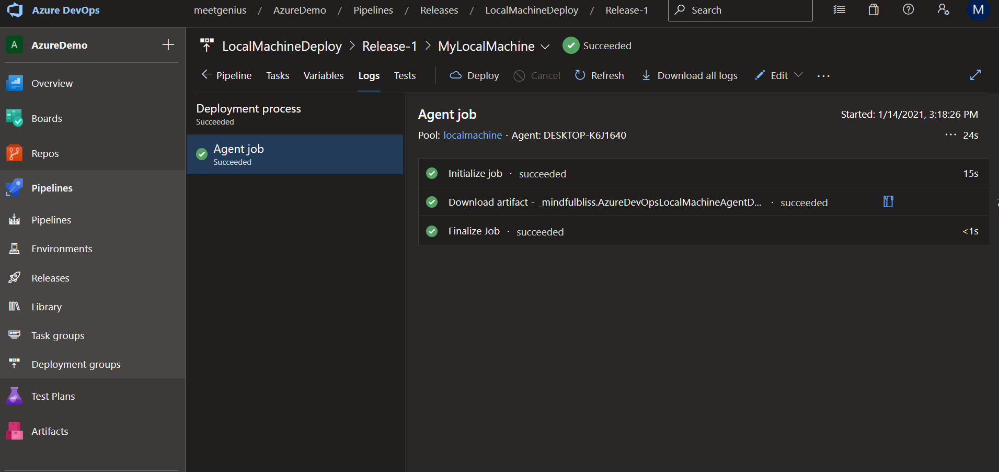



23. Check the logs 

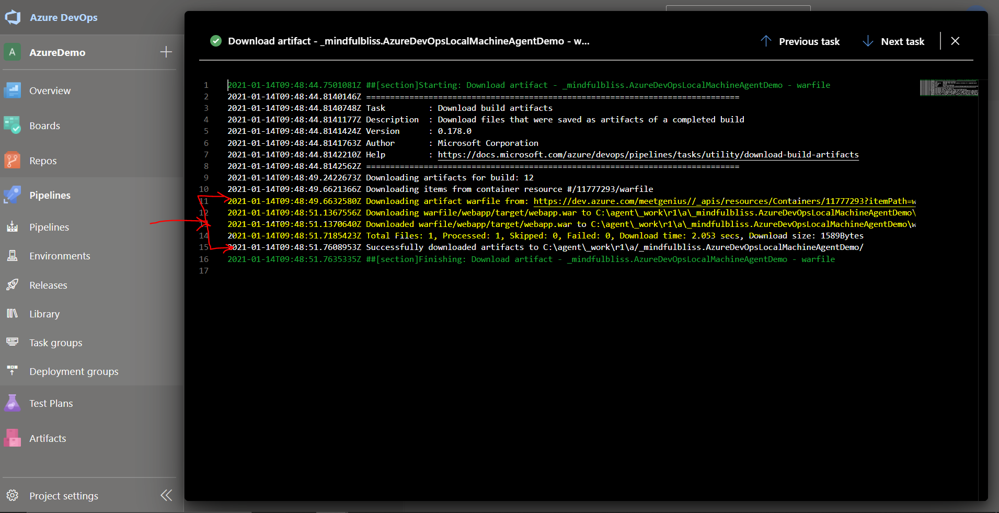

24. Check in local machin c drive 

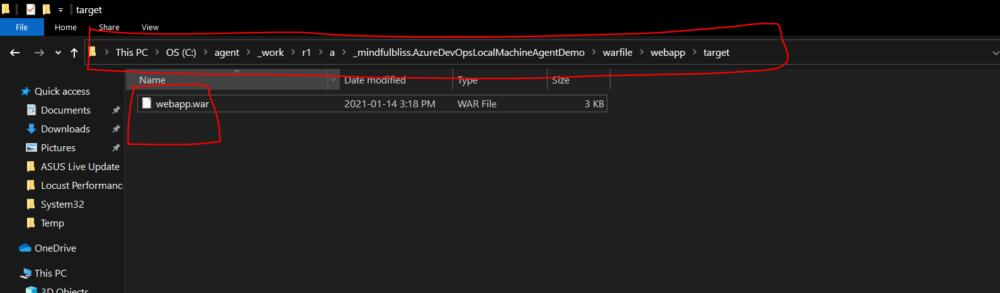

25. Now the build is in local machine, last step is now to deploy it to tomcat server on local machine so that we can access it with http://localhost:8080/webapp

26. Sub task to achieve step 25 are deploy the war in tomcat and start tomcat

27. Now go back to the release pipeline, add a stage with name "Copy the artifact to Tomcat server" and click on Save.

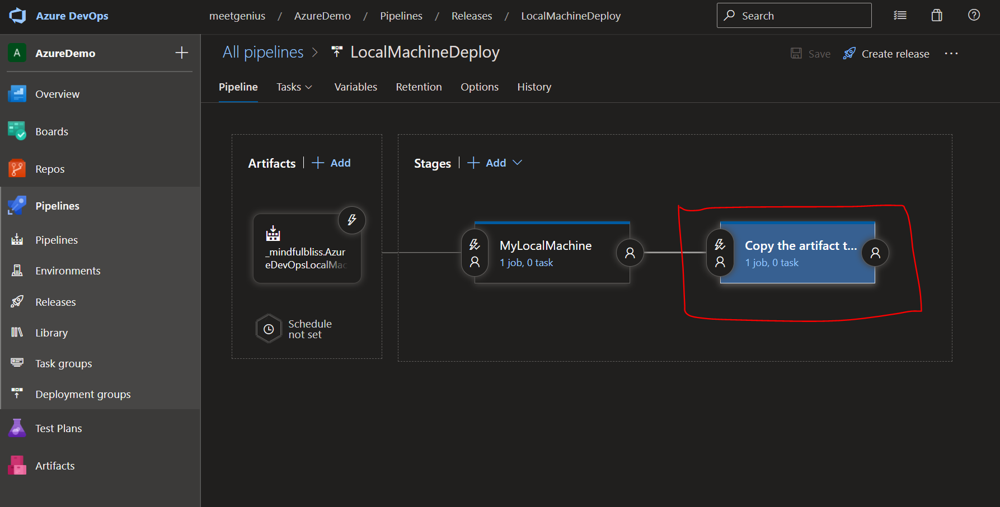



28. Click on 1 job ,0 task in Copy the artifact

29. In the agent Job , click on  add tasks, search for command line and Add it


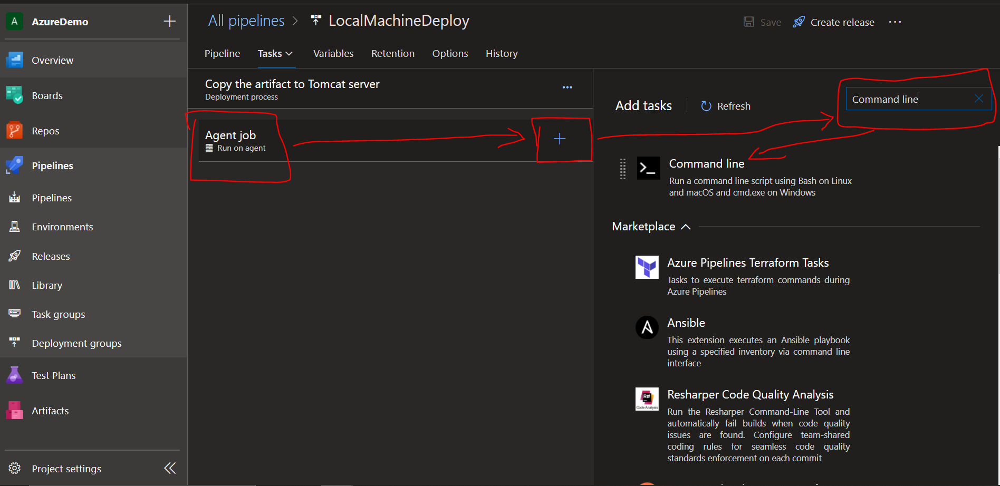

30. Click on Command Line and enter the commands to be carried out 

a . Copy artifact from target folder to tomcat web app folder 


Click on Save.



31.  Now again create release and check if the code is correctly deployed on http://localhost:8080/webapp

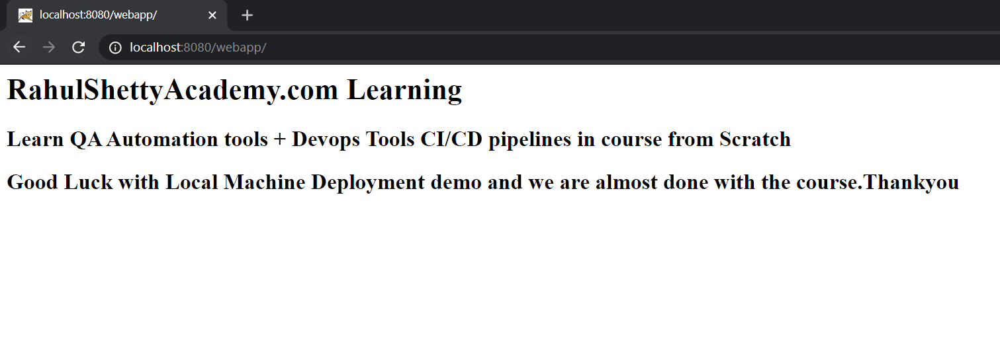

32. Now the last step remaining is making this process automated, click on the continous trigger option on artifact and enable it and validate by making changes in the code and seeing it live on the server.

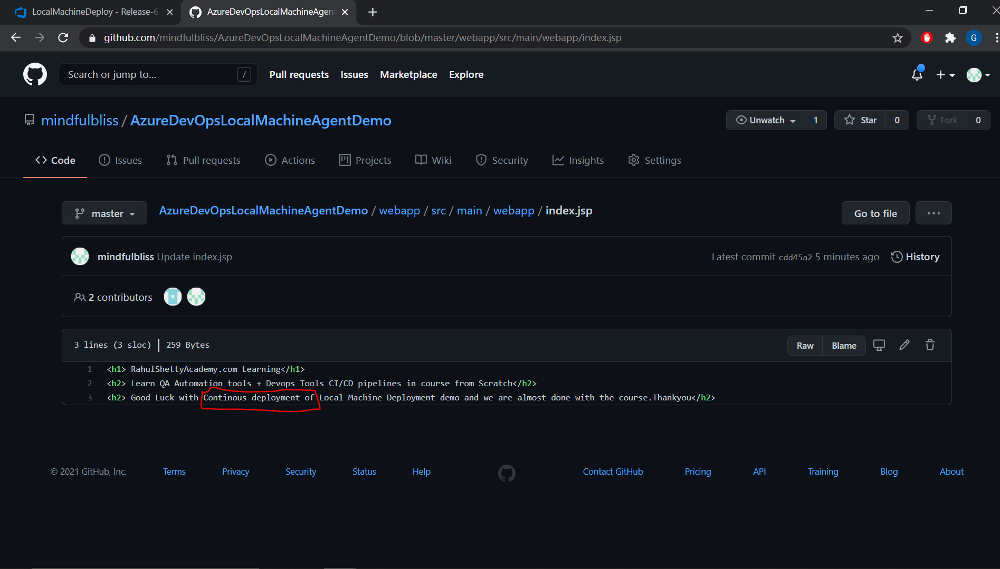


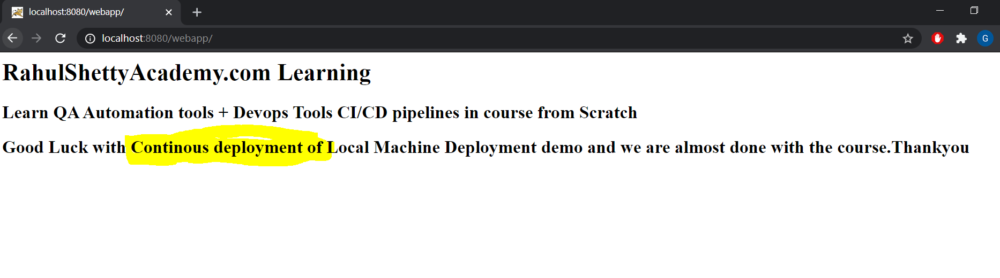
